### <b>실전 프로젝트 - CNN 기반 이미지 분류 모델의 강건성 평가</b>

* 다양한 딥러닝 분류 모델이 자율 주행 자동차, 얼굴 인식 등 <b>보안(security)</b>이 중요한 분야에서 활용되고 있습니다.
* 본 프로젝트에서는 공격자 입장에서 딥러닝 모델을 평가하는 <b>적대적 공격</b> 기법에 대하여 공부하게 됩니다.
    * 딥러닝 모델을 공격하는 다양한 적대적 공격(adversarial attack) 기법들을 구현할 수 있습니다.
    * 단계적으로 문제를 풀어보며 CNN 기반의 이미지 분류 모델의 <b>강건성(robustness)</b>을 평가하는 방법을 이해할 수 있습니다.
* GPU 가속기를 이용하기 위해 <b>[런타임]</b> - <b>[런타임 유형 변경]</b> - <b>[GPU]</b>를 선택합니다.
* 본 프로젝트를 잘 수행하기 위해 다음의 YouTube 학습 자료를 참고하세요.
    * [MI-FGSM 논문 설명(YouTube)](https://www.youtube.com/watch?v=QCgujoTPbmU): FGSM, PGD, MI-FGSM 기법에 대하여 차례대로 설명하는 동영상입니다.
* 본 프로젝트에서는 다음의 두 가지 대표적인 공격 기법을 실습합니다.
    * 이미지를 눈에 띄지 않게 변경하여 <b>이미지 분류 모델의 오작동을 유도</b>합니다.
    1. [FGSM 공격 (ICLR 2015)](https://arxiv.org/abs/1412.6572)
    2. [PGD 공격 (ICLR 2018)](https://arxiv.org/abs/1706.06083)
* 본 프로젝트는 <b>총 5개의 문제</b>로 구성됩니다.
    * <b>Problem</b>이라고 명시된 부분의 소스코드만 작성합니다.
    * <b>알아보기</b>라고 명시된 부분은 단순히 읽고 실행하면 됩니다.
* <b>Problem 5</b>에서 최대한 높은 공격력(낮은 모델 정확도)을 내는 것이 여러분의 <b>최종 목표</b>입니다.
    * 자세한 평가 기준은 <b>Problem 5</b>에서 확인하세요.
* 최종적으로 <b>팀 단위로 제출할 파일</b>은 다음과 같습니다.
    1. Colab Notebook 파일: <b>[파일]</b> - <b>[다운로드]</b> - <b>[.ipynb 다운로드]</b>

#### <b>Problem 1. 데이터셋 다운로드</b>

* 실습을 위해 [<b>Small ImageNet Validation</b> 데이터셋](https://github.com/ndb796/Small-ImageNet-Validation-Dataset-1000-Classes)을 불러옵니다.
* 본 데이터셋은 5,000개의 ImageNet 평가 이미지로 구성됩니다.
    * 데이터셋은 총 1,000개의 클래스로 구성됩니다.
    * 각 클래스마다 5개의 이미지가 존재합니다.
* PyTorch에서 곧바로 불러와 사용할 수 있도록 구성된 데이터셋입니다.
* 다음의 명령어를 이용해 데이터셋을 다운로드할 수 있습니다.

<pre>
# 깃허브에서 데이터셋 다운로드하기
!git clone https://github.com/ndb796/Small-ImageNet-Validation-Dataset-1000-Classes
# 폴더 안으로 이동
%cd Small-ImageNet-Validation-Dataset-1000-Classes
</pre>


In [1]:
# 여기에 코드를 작성하세요.
# !git clone https://github.com/ndb796/Small-ImageNet-Validation-Dataset-1000-Classes

Cloning into 'Small-ImageNet-Validation-Dataset-1000-Classes'...
Updating files:  29% (1483/5005)
Updating files:  30% (1502/5005)
Updating files:  31% (1552/5005)
Updating files:  32% (1602/5005)
Updating files:  33% (1652/5005)
Updating files:  34% (1702/5005)
Updating files:  35% (1752/5005)
Updating files:  36% (1802/5005)
Updating files:  37% (1852/5005)
Updating files:  38% (1902/5005)
Updating files:  39% (1952/5005)
Updating files:  40% (2002/5005)
Updating files:  41% (2053/5005)
Updating files:  42% (2103/5005)
Updating files:  43% (2153/5005)
Updating files:  44% (2203/5005)
Updating files:  45% (2253/5005)
Updating files:  46% (2303/5005)
Updating files:  47% (2353/5005)
Updating files:  48% (2403/5005)
Updating files:  49% (2453/5005)
Updating files:  50% (2503/5005)
Updating files:  51% (2553/5005)
Updating files:  52% (2603/5005)
Updating files:  53% (2653/5005)
Updating files:  54% (2703/5005)
Updating files:  55% (2753/5005)
Updating files:  56% (2803/5005)
Updating fi

#### <b>(알아보기) 필요한 라이브러리 불러오기</b>

* 실습을 위한 PyTorch 라이브러리를 불러옵니다.

In [1]:
import os
import time
import json
import numpy as np
import matplotlib.pyplot as plt
import PIL
from IPython.display import display

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets

# GPU 장치 사용 설정
use_cuda = True
device = torch.device("cuda" if use_cuda else "cpu")
path = os.getcwd()
file_path = os.path.join(path,"Small-ImageNet-Validation-Dataset-1000-Classes")

C:\Users\USER\anaconda3\envs\preparation\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### <b>(알아보기) 데이터셋 불러오기</b>

* PyTorch의 <b>ImageFolder 라이브러리</b>를 이용하여 <b>자신만의 데이터셋</b>을 불러올 수 있습니다.
* ImageFolder 라이브러리는 다음과 같이 <b>계층적인 폴더 구조</b>에서 데이터셋을 불러올 때 사용할 수 있습니다.
    * 각 클래스명(class name)으로 된 폴더에 여러 장의 이미지가 들어가 있는 구조입니다.

<pre>
dataset/
    class 0/
        0.jpg
        1.jpg
        ...
    class 1/
        0.jpg
        1.jpg
        ...
    ...
    class 999/
        0.jpg
        1.jpg
        ...
</pre>

* 본 프로젝트에서는 평가 목적의 데이터셋만을 사용하므로, 데이터 증진(data augmentation)을 적용하지 않습니다.

In [2]:
imsize = 224

preprocess = transforms.Compose([
    transforms.Resize((imsize, imsize)), # 이미지 사이즈 변경
    transforms.ToTensor(), # [0, 255] → [0, 1] torch.Tensor
])

data_dir = os.path.join(file_path,'ILSVRC2012_img_val_subset')

val_dataset = datasets.ImageFolder(os.path.join(data_dir), preprocess)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=16, shuffle=True, num_workers=2)
print('전체 이미지 개수:', len(val_dataset))

class_names = val_dataset.classes
print('클래스의 개수:', len(class_names))

# ImageNet 설정 파일에서 1,000개의 레이블을 불러오기
with open(os.path.join(file_path,"imagenet.json")) as f:
    imagenet_labels = json.load(f)

전체 이미지 개수: 5000
클래스의 개수: 1000


#### <b>(알아보기) 이미지 시각화하기</b>

* PyTorch로 불러온 데이터(torch.Tensor 객체)를 시각화해 봅시다.
* Google Colab에 출력하기 위해서 NumPy 형태로 변형한 뒤에 Matplotlib을 이용합니다.
    * torch.Tensor는 (Channel, Height, Width) 형식을 가집니다.
    * numpy 객체는 (Height, Width, Channel) 형식을 가집니다.

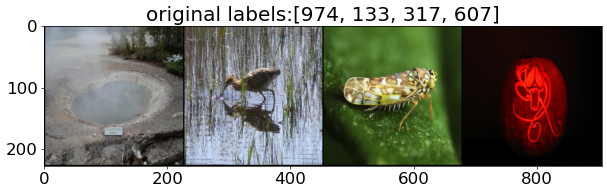

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: geyser (974)
Image #2: bittern (133)
Image #3: leafhopper (317)
Image #4: jack-o'-lantern (607)


In [3]:
# 화면에 출력되는 이미지 크기를 적절하게 조절하기
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})


def imshow_batch(image, title):
    # torch.Tensor => numpy 변환하기
    image = image.numpy().transpose((1, 2, 0))
    # 화면에 이미지 출력하기
    plt.imshow(image)
    plt.title(title)
    plt.show()


# 검증 데이터셋에서 하나의 배치를 불러와 보기
iterator = iter(val_dataloader)

# 현재 배치에 포함된 이미지를 출력하기
inputs, classes = next(iterator)
out = torchvision.utils.make_grid(inputs[:4])
imshow_batch(out, title='original labels:' + str([int(class_names[x]) for x in classes[:4]]))

print('Original labels >>>>>>>>>>>>>>>>>>>>>>>>>')
for i, x in enumerate(classes[:4]):
    imagenet_index = int(class_names[x])
    label = imagenet_labels[imagenet_index]
    print(f'Image #{i + 1}: {label} ({imagenet_index})')

#### <b>(알아보기) 사전 학습된 모델 불러오기</b>

* 사전 학습된 PyTorch [ResNet-50](https://pytorch.org/vision/stable/models.html) 모델을 불러옵니다.
* 모델에 입력을 넣기 전에 자동으로 <b>정규화(normalization)</b>를 진행하도록 합니다.
    * 사전 학습된 CNN 모델(공격 대상)이 학습할 때 사용했던 설정(mean, std)을 그대로 이용합니다.

In [4]:
# 입력 데이터를 정규화(normalization)하는 클래스
class Normalize(nn.Module) :
    def __init__(self, mean, std) :
        super(Normalize, self).__init__()
        self.register_buffer('mean', torch.Tensor(mean))
        self.register_buffer('std', torch.Tensor(std))
        
    def forward(self, input):
        mean = self.mean.reshape(1, 3, 1, 1)
        std = self.std.reshape(1, 3, 1, 1)
        return (input - mean) / std

In [5]:
resnet50 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet50(pretrained=True)
).to(device).eval()

C:\Users\USER\anaconda3\envs\preparation\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\USER\anaconda3\envs\preparation\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


* 자신이 원하는 한 장의 이미지만 불러와 시각화하고 싶을 때는 다음과 같은 코드를 이용합니다.

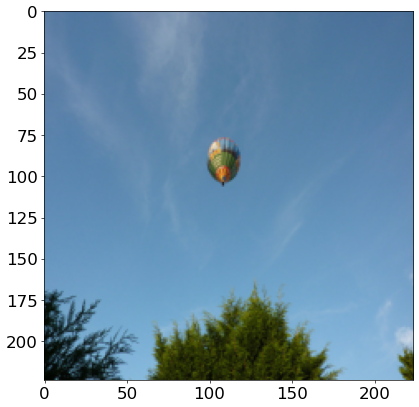

In [6]:
# 특정한 경로에서 이미지를 가져와 torch.Tensor로 변환하는 함수
def image_loader(path):
    image = PIL.Image.open(path)
    # 전처리 이후에 네트워크 입력에 들어갈 이미지에 배치 목적의 차원(dimension) 추가
    image = preprocess(image).unsqueeze(0)
    return image.to(device, torch.float) # GPU로 올리기


# torch.Tensor 형태의 이미지를 화면에 출력하는 함수
def imshow(tensor):
    # matplotlib는 CPU 기반이므로 CPU로 옮기기
    image = tensor.cpu().clone()
    # torch.Tensor에서 사용되는 배치 목적의 차원(dimension) 제거
    image = image.squeeze(0)
    # PIL 객체로 변경 
    image = transforms.ToPILImage()(image)
    # 이미지를 화면에 출력(matplotlib는 [0, 1] 사이의 값이라고 해도 정상적으로 처리)
    plt.imshow(image)


file_name = os.path.join(data_dir,"417/ILSVRC2012_val_00002809.JPEG")
image = image_loader(file_name)
imshow(image)

* 한 장의 이미지를 특정한 모델에 넣어 결과를 얻고 싶다면 다음과 같은 코드를 이용합니다.
    * 가장 확률이 높은 5개의 클래스를 차례대로 출력합니다.

In [12]:
outputs = resnet50(image)
percentages = torch.nn.functional.softmax(outputs, dim=1)[0] * 100
print("< 가장 확률이 높은 5개의 클래스 출력 >")
for i in outputs[0].topk(5)[1]:
    print(f"Index: {i.item()} / Class name: {imagenet_labels[i]} / Probability: {round(percentages[i].item(), 4)}%")

< 가장 확률이 높은 5개의 클래스 출력 >
Index: 417 / Class name: balloon / Probability: 96.9099%
Index: 701 / Class name: parachute, chute / Probability: 2.9721%
Index: 805 / Class name: soccer ball / Probability: 0.0223%
Index: 768 / Class name: rugby ball / Probability: 0.0216%
Index: 405 / Class name: airship, dirigible / Probability: 0.02%


#### <b>(알아보기) 사전 학습된 모델 평가하기</b>

* 사전 학습된 모델에 대하여 일반적인 정확도를 평가하는 함수를 작성합니다.
* 첫 번째 배치에 포함된 8개의 이미지를 분류 결과와 함께 화면에 출력합니다.

In [7]:
def validate(model):
    criterion = nn.CrossEntropyLoss()
    start_time = time.time()

    with torch.no_grad():
        running_loss = 0.
        running_corrects = 0

        for i, (inputs, basic_labels) in enumerate(val_dataloader):
            inputs = inputs.to(device)
            labels = torch.zeros_like(basic_labels).to(device)
            for j in range(labels.shape[0]):
                labels[j] = int(class_names[basic_labels[j]])
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            running_corrects += torch.sum(preds == labels.data)

            if i == 0:
                print('[Prediction Result Examples]')
                images = torchvision.utils.make_grid(inputs[:4])
                imshow_batch(images.cpu(), title='original labels:' + str([int(x) for x in labels[:4]]) +
                            '\npredicted labels:' + str([int(x) for x in preds[:4]]))
                print('Original labels >>>>>>>>>>>>>>>>>>>>>>>>>')
                for j, imagenet_index in enumerate(labels[:4]):
                    label = imagenet_labels[imagenet_index]
                    print(f'Image #{j + 1}: {label} ({imagenet_index})')
                print('Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>')
                for j, imagenet_index in enumerate(preds[:4]):
                    label = imagenet_labels[imagenet_index]
                    print(f'Image #{j + 1}: {label} ({imagenet_index})')
                images = torchvision.utils.make_grid(inputs[4:8])
                imshow_batch(images.cpu(), title='original labels:' + str([int(x) for x in labels[4:8]]) +
                            '\npredicted labels:' + str([int(x) for x in preds[4:8]]))
                print('Original labels >>>>>>>>>>>>>>>>>>>>>>>>>')
                for j, imagenet_index in enumerate(labels[4:8]):
                    label = imagenet_labels[imagenet_index]
                    print(f'Image #{j + 5}: {label} ({imagenet_index})')
                print('Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>')
                for j, imagenet_index in enumerate(preds[4:8]):
                    label = imagenet_labels[imagenet_index]
                    print(f'Image #{j + 5}: {label} ({imagenet_index})')

        epoch_loss = running_loss / len(val_dataset)
        epoch_acc = running_corrects / len(val_dataset) * 100.
        print('[Validation] Loss: {:.4f} Accuracy: {:.4f}% Time elapsed: {:.4f}s (total {} images)'.format(epoch_loss, epoch_acc, time.time() - start_time, len(val_dataset)))

[Prediction Result Examples]


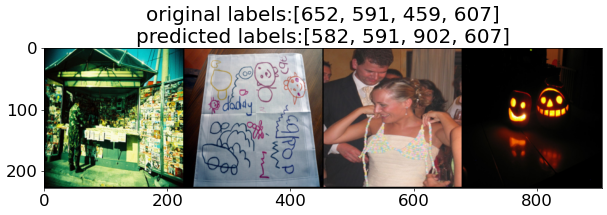

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: military uniform (652)
Image #2: handkerchief, hankie, hanky, hankey (591)
Image #3: brassiere, bra, bandeau (459)
Image #4: jack-o'-lantern (607)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: grocery store, grocery, food market, market (582)
Image #2: handkerchief, hankie, hanky, hankey (591)
Image #3: whistle (902)
Image #4: jack-o'-lantern (607)


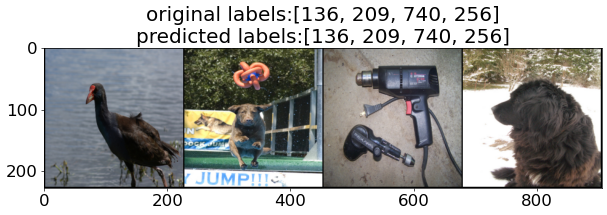

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: European gallinule, Porphyrio porphyrio (136)
Image #6: Chesapeake Bay retriever (209)
Image #7: power drill (740)
Image #8: Newfoundland, Newfoundland dog (256)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: European gallinule, Porphyrio porphyrio (136)
Image #6: Chesapeake Bay retriever (209)
Image #7: power drill (740)
Image #8: Newfoundland, Newfoundland dog (256)
[Validation] Loss: 0.0618 Accuracy: 76.0800% Time elapsed: 15.1381s (total 5000 images)


In [14]:
validate(resnet50)

#### <b>Problem 2. 다양한 모델들의 성능 비교하기</b>

* 다양한 사전 학습된 모델들에 대하여 평가를 진행합니다.
* PyTorch의 [Torchvision](https://pytorch.org/vision/stable/models.html)에서 제공하는 사전 학습된 모델들을 확인해 봅시다.
* 다음의 사전 학습된(Torchvision) 모델들에 대하여 평가를 진행하고 결과를 채워 넣으세요.
    * ResNet18: {62.64%}
    * ResNet34: {66.66%}
    * ResNet50: {77.20%}
    * ResNet101: {77.50%}
    * ResNet152: {78.18%}
    * VGG16: {37.64%}
    * VGG19: {40.00%}
    * Inception v3: {}
    * MobileNet v2: {61.46%}
    * Alexnet: {10.32%}
    * DenseNet 121: {69.34%}
    * DenseNet 201: {71.98%}

In [ ]:
# 여기에 코드를 작성하세요.
from torchvision.models import resnet18, resnet34, resnet50, resnet101, resnet152, vgg16, vgg19, \
inception_v3, mobilenet_v2, alexnet, densenet121, densenet201#,\
# ResNet18_Weights, ResNet34_Weights, ResNet50_Weights, ResNet101_Weights, ResNet152_Weights, \
# VGG16_Weights, VGG19_Weights, Inception_V3_Weights, MobileNet_V2_Weights, AlexNet_Weights, \
# DenseNet121_Weights, DenseNet201_Weights

torch.cuda.manual_seed(1218)
ResNet18 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet18(pretrained=True)).to(device).eval()
ResNet34 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet34(pretrained=True)).to(device).eval()
ResNet50 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet50(pretrained=True)).to(device).eval()
ResNet101 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet101(pretrained=True)).to(device).eval()
ResNet152 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet152(pretrained=True)).to(device).eval()
VGG16 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.inception_v3(pretrained=True)).to(device).eval()
VGG19 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.inception_v3(pretrained=True)).to(device).eval()
MobileNet_V2 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.mobilenet_v2(pretrained=True)).to(device).eval()
AlexNet = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.alexnet(pretrained=True)).to(device).eval()
DenseNet121 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.densenet121(pretrained=True)).to(device).eval()
DenseNet201 = nn.Sequential(Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.densenet201(pretrained=True)).to(device).eval()

[Prediction Result Examples]


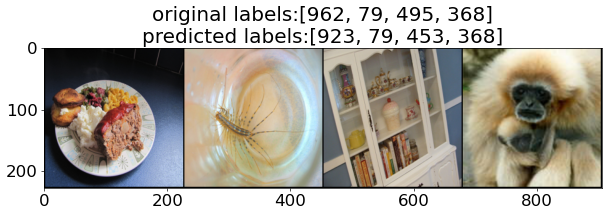

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: meat loaf, meatloaf (962)
Image #2: centipede (79)
Image #3: china cabinet, china closet (495)
Image #4: gibbon, Hylobates lar (368)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: plate (923)
Image #2: centipede (79)
Image #3: bookcase (453)
Image #4: gibbon, Hylobates lar (368)


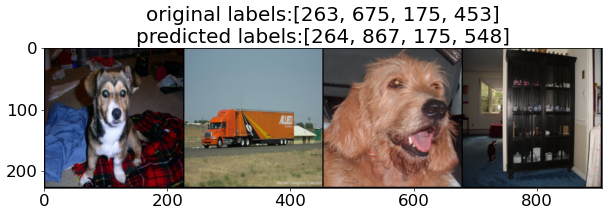

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Pembroke, Pembroke Welsh corgi (263)
Image #6: moving van (675)
Image #7: otterhound, otter hound (175)
Image #8: bookcase (453)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Cardigan, Cardigan Welsh corgi (264)
Image #6: trailer truck, tractor trailer, trucking rig, rig, articulated lorry, semi (867)
Image #7: otterhound, otter hound (175)
Image #8: entertainment center (548)
[Validation] Loss: 0.0988 Accuracy: 62.6400% Time elapsed: 10.7065s (total 5000 images)
[Prediction Result Examples]


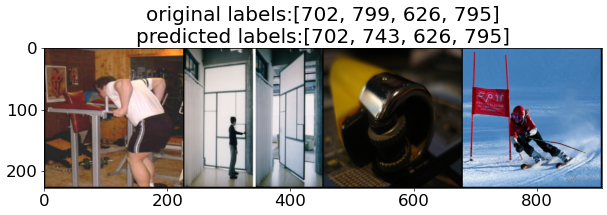

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: parallel bars, bars (702)
Image #2: sliding door (799)
Image #3: lighter, light, igniter, ignitor (626)
Image #4: ski (795)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: parallel bars, bars (702)
Image #2: prison, prison house (743)
Image #3: lighter, light, igniter, ignitor (626)
Image #4: ski (795)


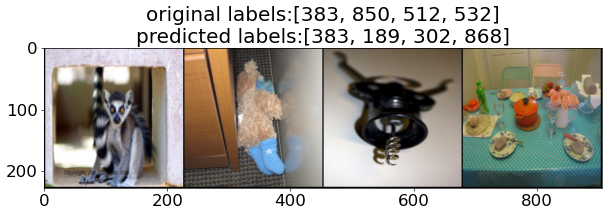

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Madagascar cat, ring-tailed lemur, Lemur catta (383)
Image #6: teddy, teddy bear (850)
Image #7: corkscrew, bottle screw (512)
Image #8: dining table, board (532)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Madagascar cat, ring-tailed lemur, Lemur catta (383)
Image #6: Lakeland terrier (189)
Image #7: ground beetle, carabid beetle (302)
Image #8: tray (868)
[Validation] Loss: 0.0863 Accuracy: 66.6600% Time elapsed: 10.7123s (total 5000 images)
[Prediction Result Examples]


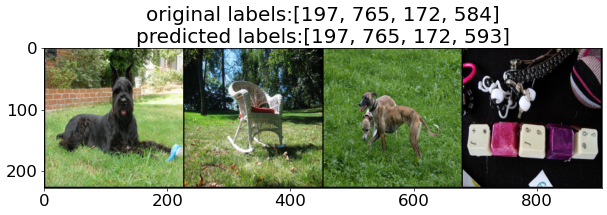

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: giant schnauzer (197)
Image #2: rocking chair, rocker (765)
Image #3: whippet (172)
Image #4: hair slide (584)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: giant schnauzer (197)
Image #2: rocking chair, rocker (765)
Image #3: whippet (172)
Image #4: harmonica, mouth organ, harp, mouth harp (593)


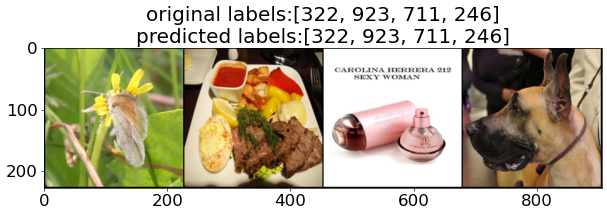

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: ringlet, ringlet butterfly (322)
Image #6: plate (923)
Image #7: perfume, essence (711)
Image #8: Great Dane (246)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: ringlet, ringlet butterfly (322)
Image #6: plate (923)
Image #7: perfume, essence (711)
Image #8: Great Dane (246)
[Validation] Loss: 0.0707 Accuracy: 77.2000% Time elapsed: 10.9494s (total 5000 images)
[Prediction Result Examples]


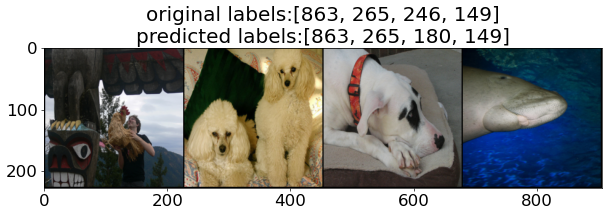

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: totem pole (863)
Image #2: toy poodle (265)
Image #3: Great Dane (246)
Image #4: dugong, Dugong dugon (149)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: totem pole (863)
Image #2: toy poodle (265)
Image #3: American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier (180)
Image #4: dugong, Dugong dugon (149)


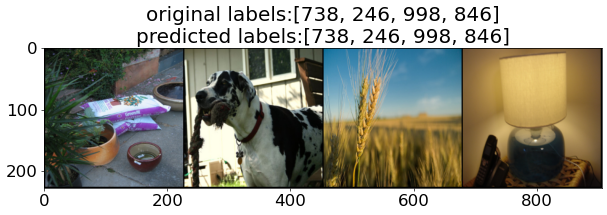

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: pot, flowerpot (738)
Image #6: Great Dane (246)
Image #7: ear, spike, capitulum (998)
Image #8: table lamp (846)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: pot, flowerpot (738)
Image #6: Great Dane (246)
Image #7: ear, spike, capitulum (998)
Image #8: table lamp (846)
[Validation] Loss: 0.0637 Accuracy: 77.5000% Time elapsed: 10.7023s (total 5000 images)
[Prediction Result Examples]


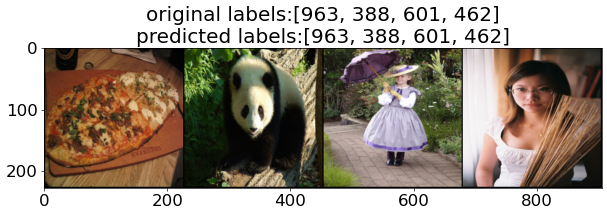

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: pizza, pizza pie (963)
Image #2: giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca (388)
Image #3: hoopskirt, crinoline (601)
Image #4: broom (462)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: pizza, pizza pie (963)
Image #2: giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca (388)
Image #3: hoopskirt, crinoline (601)
Image #4: broom (462)


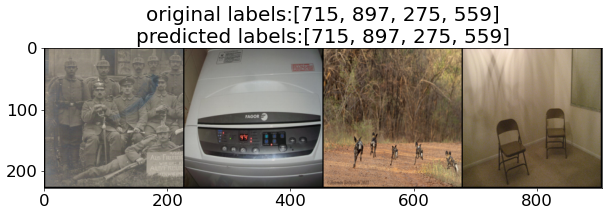

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: pickelhaube (715)
Image #6: washer, automatic washer, washing machine (897)
Image #7: African hunting dog, hyena dog, Cape hunting dog, Lycaon pictus (275)
Image #8: folding chair (559)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: pickelhaube (715)
Image #6: washer, automatic washer, washing machine (897)
Image #7: African hunting dog, hyena dog, Cape hunting dog, Lycaon pictus (275)
Image #8: folding chair (559)
[Validation] Loss: 0.0612 Accuracy: 78.1800% Time elapsed: 12.9475s (total 5000 images)
[Prediction Result Examples]


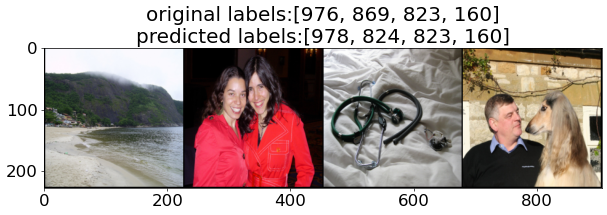

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: promontory, headland, head, foreland (976)
Image #2: trench coat (869)
Image #3: stethoscope (823)
Image #4: Afghan hound, Afghan (160)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: seashore, coast, seacoast, sea-coast (978)
Image #2: stole (824)
Image #3: stethoscope (823)
Image #4: Afghan hound, Afghan (160)


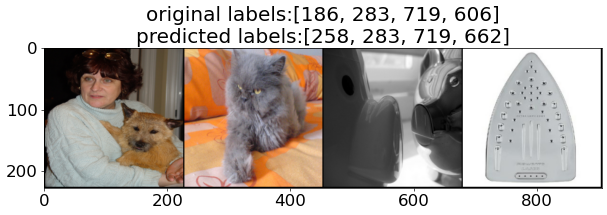

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Norwich terrier (186)
Image #6: Persian cat (283)
Image #7: piggy bank, penny bank (719)
Image #8: iron, smoothing iron (606)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Samoyed, Samoyede (258)
Image #6: Persian cat (283)
Image #7: piggy bank, penny bank (719)
Image #8: modem (662)
[Validation] Loss: 0.1860 Accuracy: 37.6400% Time elapsed: 13.0286s (total 5000 images)
[Prediction Result Examples]


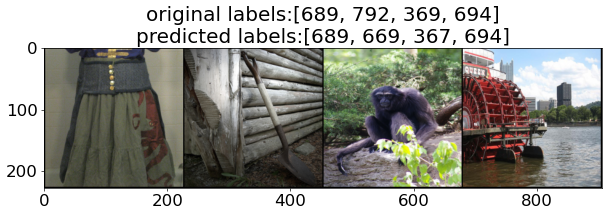

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: overskirt (689)
Image #2: shovel (792)
Image #3: siamang, Hylobates syndactylus, Symphalangus syndactylus (369)
Image #4: paddlewheel, paddle wheel (694)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: overskirt (689)
Image #2: mosquito net (669)
Image #3: chimpanzee, chimp, Pan troglodytes (367)
Image #4: paddlewheel, paddle wheel (694)


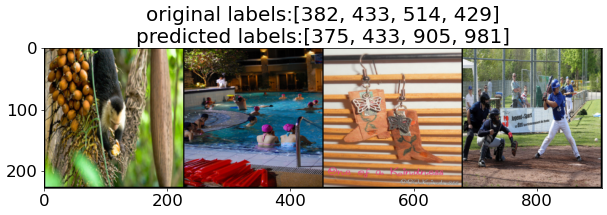

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: squirrel monkey, Saimiri sciureus (382)
Image #6: bathing cap, swimming cap (433)
Image #7: cowboy boot (514)
Image #8: baseball (429)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: colobus, colobus monkey (375)
Image #6: bathing cap, swimming cap (433)
Image #7: window shade (905)
Image #8: ballplayer, baseball player (981)
[Validation] Loss: 0.1808 Accuracy: 40.0000% Time elapsed: 13.6375s (total 5000 images)
[Prediction Result Examples]


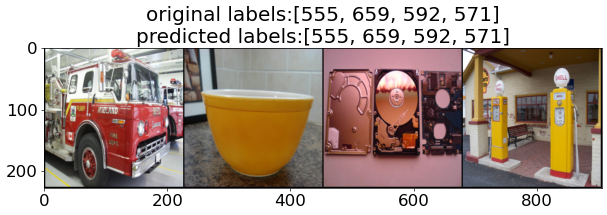

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: fire engine, fire truck (555)
Image #2: mixing bowl (659)
Image #3: hard disc, hard disk, fixed disk (592)
Image #4: gas pump, gasoline pump, petrol pump, island dispenser (571)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: fire engine, fire truck (555)
Image #2: mixing bowl (659)
Image #3: hard disc, hard disk, fixed disk (592)
Image #4: gas pump, gasoline pump, petrol pump, island dispenser (571)


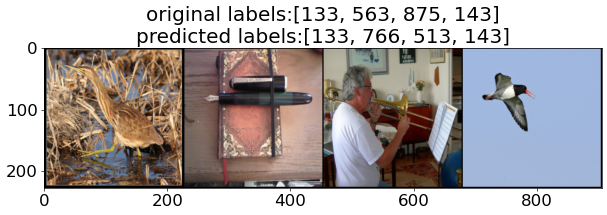

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: bittern (133)
Image #6: fountain pen (563)
Image #7: trombone (875)
Image #8: oystercatcher, oyster catcher (143)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: bittern (133)
Image #6: rotisserie (766)
Image #7: cornet, horn, trumpet, trump (513)
Image #8: oystercatcher, oyster catcher (143)
[Validation] Loss: 0.1428 Accuracy: 61.4600% Time elapsed: 10.5001s (total 5000 images)
[Prediction Result Examples]


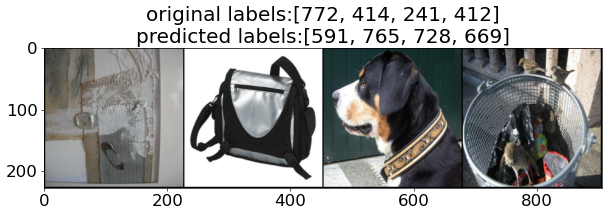

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: safety pin (772)
Image #2: backpack, back pack, knapsack, packsack, rucksack, haversack (414)
Image #3: EntleBucher (241)
Image #4: ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin (412)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: handkerchief, hankie, hanky, hankey (591)
Image #2: rocking chair, rocker (765)
Image #3: plastic bag (728)
Image #4: mosquito net (669)


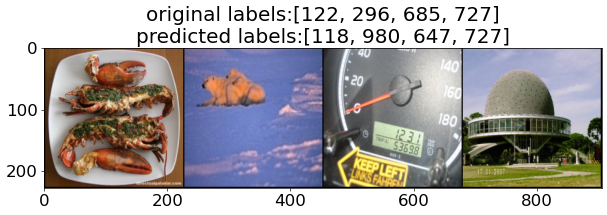

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: American lobster, Northern lobster, Maine lobster, Homarus americanus (122)
Image #6: ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus (296)
Image #7: odometer, hodometer, mileometer, milometer (685)
Image #8: planetarium (727)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Dungeness crab, Cancer magister (118)
Image #6: volcano (980)
Image #7: measuring cup (647)
Image #8: planetarium (727)
[Validation] Loss: 0.3449 Accuracy: 10.3200% Time elapsed: 10.6104s (total 5000 images)
[Prediction Result Examples]


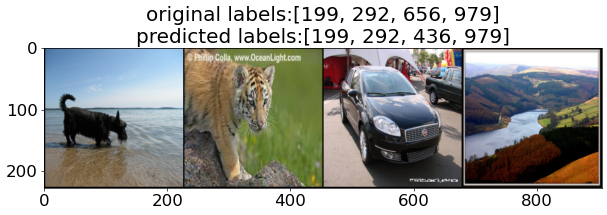

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: Scotch terrier, Scottish terrier, Scottie (199)
Image #2: tiger, Panthera tigris (292)
Image #3: minivan (656)
Image #4: valley, vale (979)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: Scotch terrier, Scottish terrier, Scottie (199)
Image #2: tiger, Panthera tigris (292)
Image #3: beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon (436)
Image #4: valley, vale (979)


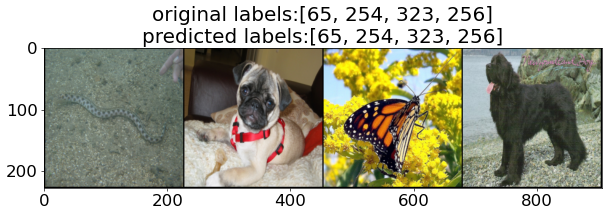

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: sea snake (65)
Image #6: pug, pug-dog (254)
Image #7: monarch, monarch butterfly, milkweed butterfly, Danaus plexippus (323)
Image #8: Newfoundland, Newfoundland dog (256)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: sea snake (65)
Image #6: pug, pug-dog (254)
Image #7: monarch, monarch butterfly, milkweed butterfly, Danaus plexippus (323)
Image #8: Newfoundland, Newfoundland dog (256)
[Validation] Loss: 0.0793 Accuracy: 69.3400% Time elapsed: 12.7497s (total 5000 images)
[Prediction Result Examples]


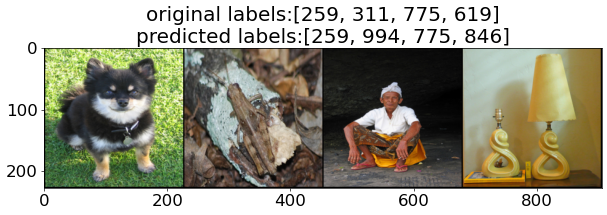

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: Pomeranian (259)
Image #2: grasshopper, hopper (311)
Image #3: sarong (775)
Image #4: lampshade, lamp shade (619)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: Pomeranian (259)
Image #2: stinkhorn, carrion fungus (994)
Image #3: sarong (775)
Image #4: table lamp (846)


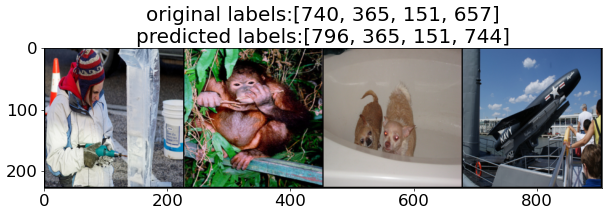

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: power drill (740)
Image #6: orangutan, orang, orangutang, Pongo pygmaeus (365)
Image #7: Chihuahua (151)
Image #8: missile (657)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: ski mask (796)
Image #6: orangutan, orang, orangutang, Pongo pygmaeus (365)
Image #7: Chihuahua (151)
Image #8: projectile, missile (744)
[Validation] Loss: 0.0714 Accuracy: 71.9800% Time elapsed: 15.8992s (total 5000 images)


In [42]:
validate(ResNet18)
validate(ResNet34)
validate(ResNet50)
validate(ResNet101)
validate(ResNet152)
validate(VGG16)
validate(VGG19)

validate(MobileNet_V2)
validate(AlexNet)
validate(DenseNet121)
validate(DenseNet201)

[Prediction Result Examples]


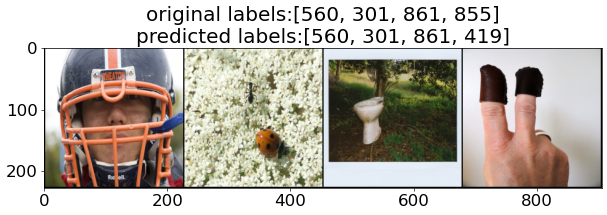

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: football helmet (560)
Image #2: ladybug, ladybeetle, lady beetle, ladybird, ladybird beetle (301)
Image #3: toilet seat (861)
Image #4: thimble (855)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: football helmet (560)
Image #2: ladybug, ladybeetle, lady beetle, ladybird, ladybird beetle (301)
Image #3: toilet seat (861)
Image #4: Band Aid (419)


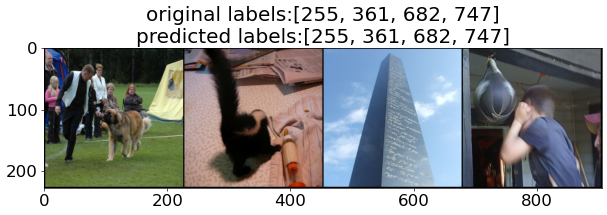

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Leonberg (255)
Image #6: skunk, polecat, wood pussy (361)
Image #7: obelisk (682)
Image #8: punching bag, punch bag, punching ball, punchball (747)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Leonberg (255)
Image #6: skunk, polecat, wood pussy (361)
Image #7: obelisk (682)
Image #8: punching bag, punch bag, punching ball, punchball (747)
[Validation] Loss: 0.1213 Accuracy: 67.9800% Time elapsed: 9.8361s (total 5000 images)


In [94]:
# Inception_V3 = torchvision.models.inception_v3(pretrained=True).cuda()
Inception_V3 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.inception_v3(pretrained=True)
).to(device).eval()
validate(Inception_V3)

#### <b>(알아보기) 공격 기법 평가 함수 작성하기</b>

* 일반적으로 적대적 공격(adversarial attack)은 ① 거리 ② 공격력이 평가 기준입니다.
* <b>거리</b>: Linf는 대표적인 거리 평가 기준으로, 가장 많이 변경된 픽셀(R, G, B 각각)의 변경된 정도를 의미합니다.
    * 일반적으로 각 픽셀이 16/255까지 변경되더라도 인간에게 크게 눈에 띄지 않는다고 가정합니다.
* <b>공격력</b>: 원본 클래스가 아니도록 만드는 공격(untargeted)에서는 <b>(100 - 모델의 정확도)</b>으로 공격력을 평가할 수 있습니다.
    * 본 프로젝트에서는 untargeted 공격만 가정합니다.

* 원본 이미지와의 거리 차이를 반환하는 함수를 정의합니다.
    * 본 프로젝트에서는 Linf 거리만을 사용합니다.
    * 참고로 일반적으로 PyTorch에서 모든 픽셀의 값은 [0, 1] 사이의 실수 값을 갖도록 합니다.

In [8]:
def get_distance(a, b):
    l0 = torch.norm((a - b).view(a.shape[0], -1), p=0, dim=1)
    l2 = torch.norm((a - b).view(a.shape[0], -1), p=2, dim=1)
    mse = (a - b).view(a.shape[0], -1).pow(2).mean(1)
    linf = torch.norm((a - b).view(a.shape[0], -1), p=float('inf'), dim=1)
    return l0, l2, mse, linf

* 특정한 공격 기법을 이용해 특정한 모델의 <b>강건성(robustness)</b>을 평가하는 함수를 정의합니다.
    * <b>model</b>: 공격을 수행해 볼 모델
    * <b>attack</b>: 사용할 공격 기법

In [9]:
def attack_validate(model, attack):
    criterion = nn.CrossEntropyLoss()
    start_time = time.time()

    running_loss = 0.
    running_corrects = 0
    running_length = 0

    running_l0 = 0
    running_l2 = 0
    running_mse = 0
    running_linf = 0

    for i, (inputs, basic_labels) in enumerate(val_dataloader):
        inputs = inputs.to(device)
        labels = torch.zeros_like(basic_labels).long().to(device)
        for j in range(labels.shape[0]):
            labels[j] = int(class_names[basic_labels[j]])
        labels = labels.to(device)

        adv_image, perturbation = attack.perturb(model, inputs, labels) # adversarial attack

        outputs = model(adv_image)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)
        running_length += labels.shape[0]

        l0, l2, mse, linf = get_distance(adv_image, inputs)
        running_l0 += l0.sum().item()
        running_l2 += l2.sum().item()
        running_mse += mse.sum().item()
        running_linf += linf.sum().item()

        if i == 0:
            print('The dimension of an image tensor:', inputs.shape[1:])
            print('[Prediction Result Examples]')
            images = torchvision.utils.make_grid(adv_image[:4])
            imshow_batch(images.cpu(), title='original labels:' + str([int(x) for x in labels[:4]]) +
                          '\npredicted labels:' + str([int(x) for x in preds[:4]]))
            print('Original labels >>>>>>>>>>>>>>>>>>>>>>>>>')
            for j, imagenet_index in enumerate(labels[:4]):
                label = imagenet_labels[imagenet_index]
                print(f'Image #{j + 1}: {label} ({imagenet_index})')
            print('Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>')
            for j, imagenet_index in enumerate(preds[:4]):
                label = imagenet_labels[imagenet_index]
                print(f'Image #{j + 1}: {label} ({imagenet_index})')
            images = torchvision.utils.make_grid(adv_image[4:8])
            imshow_batch(images.cpu(), title='original labels:' + str([int(x) for x in labels[4:8]]) +
                          '\npredicted labels:' + str([int(x) for x in preds[4:8]]))
            print('Original labels >>>>>>>>>>>>>>>>>>>>>>>>>')
            for j, imagenet_index in enumerate(labels[4:8]):
                label = imagenet_labels[imagenet_index]
                print(f'Image #{j + 5}: {label} ({imagenet_index})')
            print('Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>')
            for j, imagenet_index in enumerate(preds[4:8]):
                label = imagenet_labels[imagenet_index]
                print(f'Image #{j + 5}: {label} ({imagenet_index})')

        if i % 10 == 0:
            cur_running_loss = running_loss / running_length
            running_acc = running_corrects / running_length * 100.
            print('[Step #{}] Loss: {:.4f} Accuracy: {:.4f}% Time elapsed: {:.4f}s (total {} images)'.format(i, cur_running_loss, running_acc, time.time() - start_time, running_length))

    epoch_loss = running_loss / len(val_dataset)
    epoch_acc = running_corrects / len(val_dataset) * 100.
    print('[Validation] Loss: {:.4f} Accuracy: {:.4f}% Time elapsed: {:.4f}s (total {} images)'.format(epoch_loss, epoch_acc, time.time() - start_time, len(val_dataset)))

    print('[Size of Perturbation]')
    print('Average L0 distance (the number of changed parameters):', running_l0 / len(val_dataset))
    print('Average L2 distance:', running_l2 / len(val_dataset))
    print('Average MSE:', running_mse / len(val_dataset))
    print('Average Linf distance (the maximum changed values):', running_linf / len(val_dataset))

#### <b>(알아보기) FGSM 공격 클래스 정의하기</b>

* FGSM (Fast Gradient Sign Method)은 각 픽셀마다 비용이 증가하는 방향으로 eps만큼 변경하는 공격 기법입니다.
* FGSM은 딥러닝 분류 모델이 작은 크기의 perturbation에도 매우 취약할 수 있음을 보인 논문([ICLR 2015](https://arxiv.org/abs/1412.6572))입니다.

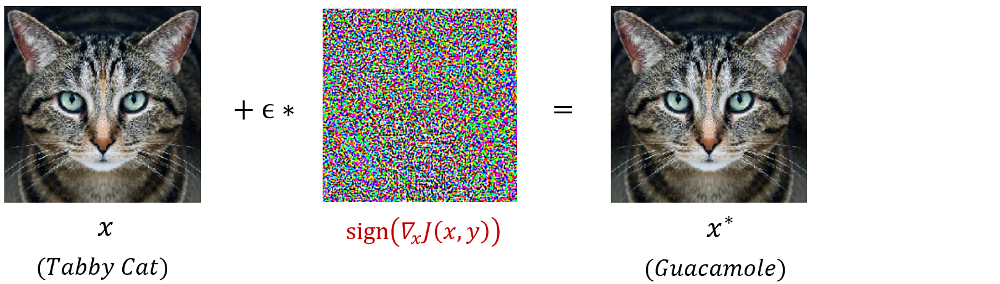

In [10]:
# FGSM 공격 클래스
class FGSM:
    def __init__(self, eps):
        self.eps = eps
    
    def perturb(self, model, images, labels):
        # 이미지와 레이블 데이터를 GPU로 옮기기
        images = images.to(device)
        labels = labels.to(device)

        # 입력 이미지와 동일한 크기를 갖는 노이즈(perturbation) 생성
        perturbation = torch.zeros_like(images).to(device)
        # 손실(loss) 함수 설정
        attack_loss = nn.CrossEntropyLoss()

        # required_grad 속성의 값을 True로 설정하여 해당 torch.Tensor의 연산을 추적
        perturbation.requires_grad = True

        outputs = model(images + perturbation) # 모델의 판단 결과 확인

        # 손실 함수에 대하여 미분하여 기울기(gradient) 계산
        model.zero_grad()
        cost = attack_loss(outputs, labels).to(device)
        cost.backward()

        # 계산된 기울기(gradient)를 이용하여 손실 함수가 증가하는 방향으로 업데이트
        diff = perturbation.grad.sign()
        # 결과적으로 노이즈(perturbation)의 각 픽셀의 값이 [-eps, eps] 사이의 값이 되도록 자르기
        perturbation = torch.clamp(perturbation + diff, min=-self.eps, max=self.eps).detach_() # 연산을 추적하는 것을 중단하기 위해 detach() 호출

        # (최종적으로 만들어진 공격 이미지, 노이즈) 반환
        current = torch.clamp(images + perturbation, min=0, max=1)
        return current, perturbation

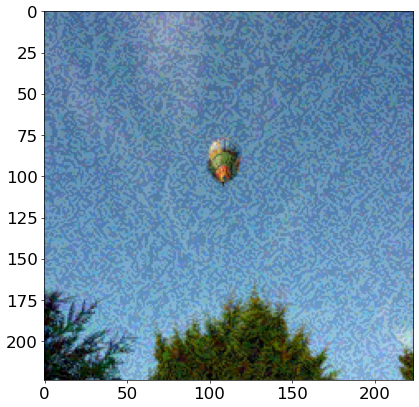

In [51]:
resnet50 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet50(pretrained=True)
).to(device).eval()
# 풍선(balloon)이 아닌 클래스로 분류되도록 공격 수행
label = [417]
label = torch.Tensor(label)
label = label.type(torch.long)

# 공격 결과 계산하기
attack = FGSM(eps=16/255) # 공격용 파라미터 설정
adv_image, perturbation = attack.perturb(resnet50, image, label)

# 최종적으로 만들어진 공격 이미지 출력
plt.figure()
imshow(adv_image)

In [52]:
# 완성된 공격 이미지를 실제 모델에 넣어 결과 확인
outputs = resnet50(adv_image)
# 확률을 계산하기 위해 소프트맥스(softmax) 함수 취하기
percentages = torch.nn.functional.softmax(outputs, dim=1)[0] * 100
# 가장 높은 값을 가지는 5개의 인덱스를 하나씩 확인하며
print("< 가장 높은 확률을 가지는 클래스들 >")
for i in outputs[0].topk(5)[1]:
    # 높은 값을 가지는 순서대로 인덱스에 해당하는 클래스 이름과, 그 확률 값 출력하기
    print(f"인덱스: {i.item()} / 클래스명: {imagenet_labels[i]} / 확률: {round(percentages[i].item(), 4)}%")

< 가장 높은 확률을 가지는 클래스들 >
인덱스: 735 / 클래스명: poncho / 확률: 40.3076%
인덱스: 591 / 클래스명: handkerchief, hankie, hanky, hankey / 확률: 7.7405%
인덱스: 815 / 클래스명: spider web, spider's web / 확률: 7.39%
인덱스: 721 / 클래스명: pillow / 확률: 3.754%
인덱스: 310 / 클래스명: ant, emmet, pismire / 확률: 3.4743%


The dimension of an image tensor: torch.Size([3, 224, 224])
[Prediction Result Examples]


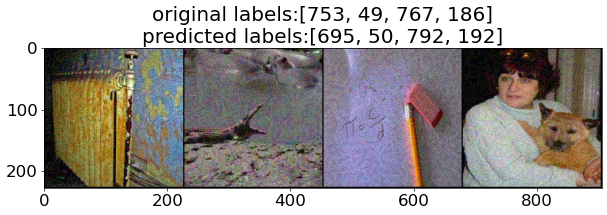

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: radiator (753)
Image #2: African crocodile, Nile crocodile, Crocodylus niloticus (49)
Image #3: rubber eraser, rubber, pencil eraser (767)
Image #4: Norwich terrier (186)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: padlock (695)
Image #2: American alligator, Alligator mississipiensis (50)
Image #3: shovel (792)
Image #4: cairn, cairn terrier (192)


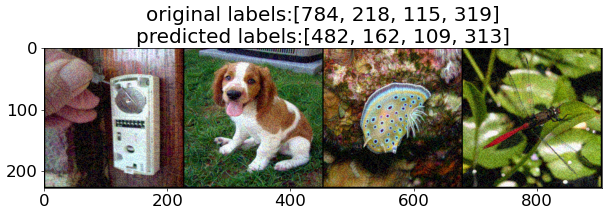

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: screwdriver (784)
Image #6: Welsh springer spaniel (218)
Image #7: sea slug, nudibranch (115)
Image #8: dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk (319)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: cassette player (482)
Image #6: beagle (162)
Image #7: brain coral (109)
Image #8: walking stick, walkingstick, stick insect (313)
[Step #0] Loss: 0.3788 Accuracy: 0.0000% Time elapsed: 1.8173s (total 16 images)
[Step #10] Loss: 0.4011 Accuracy: 5.6818% Time elapsed: 2.4894s (total 176 images)
[Step #20] Loss: 0.3866 Accuracy: 7.4405% Time elapsed: 3.1500s (total 336 images)
[Step #30] Loss: 0.3951 Accuracy: 6.6532% Time elapsed: 3.8097s (total 496 images)
[Step #40] Loss: 0.3953 Accuracy: 6.7073% Time elapsed: 4.4690s (total 656 images)
[Step #50] Loss: 0.3970 Accuracy: 7.1078% Time elapsed: 5.1308s (total 816 images)
[Step #60] Loss: 0.3948 Accuracy: 7.

In [53]:
attack = FGSM(eps=16/255) # 공격용 파라미터 설정
attack_validate(resnet50, attack)

#### <b>Problem 3. FGSM 공격 성능 분석하기</b>

* <b>적대적 노이즈(adversarial noise)</b>의 크기를 조절하며 FGSM 공격 결과를 분석합니다.
    * 적대적 노이즈를 perturbation라고도 부릅니다.
    * perturbation의 크기(원본 이미지와의 거리) 값인 eps이 커질수록 인간의 눈에 잘 띄게 됩니다.
    * 일반적으로 Linf 기준으로 eps 값을 16/255로 설정하여 각 픽셀이 16/255만큼 바뀔 수 있도록 합니다.
* 다음의 <b>eps 값을 바꾸어 가며</b> ResNet50 모델을 공격한 뒤에 모델의 정확도를 확인하세요.
    * FGSM 공격 (eps=1/255): {10.96%}
    * FGSM 공격 (eps=2/255): {6.26%}
    * FGSM 공격 (eps=4/255): {5.52%}
    * FGSM 공격 (eps=8/255): {6.78%}
    * FGSM 공격 (eps=16/255): {8.92%}
    * FGSM 공격 (eps=32/255): {7.22%}
    * FGSM 공격 (eps=64/255): {0.70%}
* 본 실습에서는 모델의 정확도가 낮을수록, 공격력이 높은 것입니다.

The dimension of an image tensor: torch.Size([3, 224, 224])
[Prediction Result Examples]


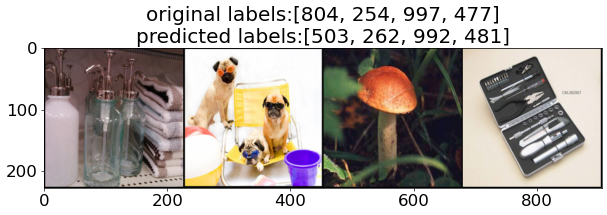

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: soap dispenser (804)
Image #2: pug, pug-dog (254)
Image #3: bolete (997)
Image #4: carpenter's kit, tool kit (477)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: cocktail shaker (503)
Image #2: Brabancon griffon (262)
Image #3: agaric (992)
Image #4: cassette (481)


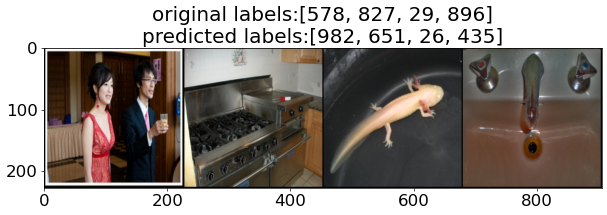

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: gown (578)
Image #6: stove (827)
Image #7: axolotl, mud puppy, Ambystoma mexicanum (29)
Image #8: washbasin, handbasin, washbowl, lavabo, wash-hand basin (896)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: groom, bridegroom (982)
Image #6: microwave, microwave oven (651)
Image #7: common newt, Triturus vulgaris (26)
Image #8: bathtub, bathing tub, bath, tub (435)
[Step #0] Loss: 0.2892 Accuracy: 6.2500% Time elapsed: 1.8788s (total 16 images)
[Step #10] Loss: 0.4294 Accuracy: 11.3636% Time elapsed: 2.5492s (total 176 images)
[Step #20] Loss: 0.4168 Accuracy: 12.2024% Time elapsed: 3.2136s (total 336 images)
[Step #30] Loss: 0.4215 Accuracy: 11.2903% Time elapsed: 3.8787s (total 496 images)
[Step #40] Loss: 0.4148 Accuracy: 11.8902% Time elapsed: 4.5406s (total 656 images)
[Step #50] Loss: 0.4174 Accuracy: 11.2745% Time elapsed: 5.2087s (total 816 images)
[Step #60] Loss: 0.4178 Accuracy: 11.3729% Time elapsed: 5.8732s (total 97

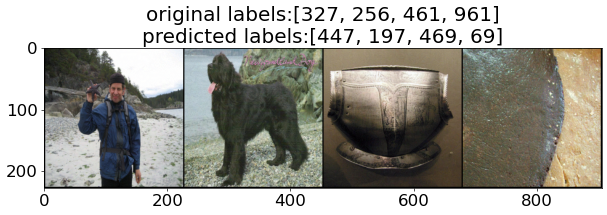

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: starfish, sea star (327)
Image #2: Newfoundland, Newfoundland dog (256)
Image #3: breastplate, aegis, egis (461)
Image #4: dough (961)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: binoculars, field glasses, opera glasses (447)
Image #2: giant schnauzer (197)
Image #3: caldron, cauldron (469)
Image #4: trilobite (69)


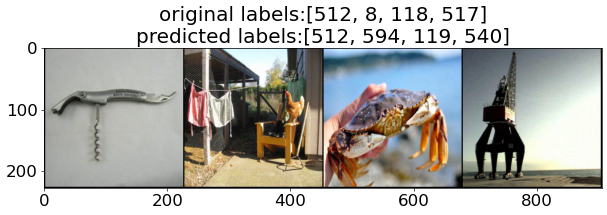

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: corkscrew, bottle screw (512)
Image #6: hen (8)
Image #7: Dungeness crab, Cancer magister (118)
Image #8: crane (517)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: corkscrew, bottle screw (512)
Image #6: harp (594)
Image #7: rock crab, Cancer irroratus (119)
Image #8: drilling platform, offshore rig (540)
[Step #0] Loss: 0.5658 Accuracy: 6.2500% Time elapsed: 1.6223s (total 16 images)
[Step #10] Loss: 0.4781 Accuracy: 6.2500% Time elapsed: 2.3224s (total 176 images)
[Step #20] Loss: 0.4683 Accuracy: 5.9524% Time elapsed: 2.9864s (total 336 images)
[Step #30] Loss: 0.4727 Accuracy: 4.8387% Time elapsed: 3.6450s (total 496 images)
[Step #40] Loss: 0.4731 Accuracy: 6.0976% Time elapsed: 4.3091s (total 656 images)
[Step #50] Loss: 0.4673 Accuracy: 6.1275% Time elapsed: 4.9707s (total 816 images)
[Step #60] Loss: 0.4702 Accuracy: 6.2500% Time elapsed: 5.6301s (total 976 images)
[Step #70] Loss: 0.4775 Accuracy: 5.9859% Time elapsed:

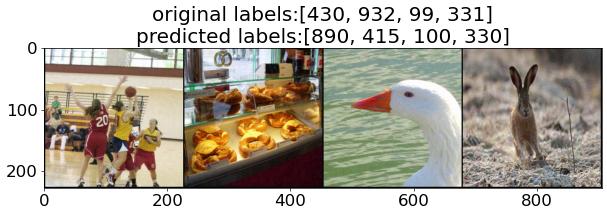

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: basketball (430)
Image #2: pretzel (932)
Image #3: goose (99)
Image #4: hare (331)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: volleyball (890)
Image #2: bakery, bakeshop, bakehouse (415)
Image #3: black swan, Cygnus atratus (100)
Image #4: wood rabbit, cottontail, cottontail rabbit (330)


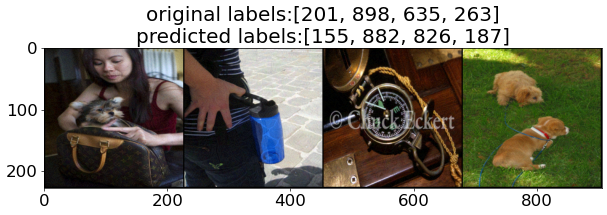

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: silky terrier, Sydney silky (201)
Image #6: water bottle (898)
Image #7: magnetic compass (635)
Image #8: Pembroke, Pembroke Welsh corgi (263)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Shih-Tzu (155)
Image #6: vacuum, vacuum cleaner (882)
Image #7: stopwatch, stop watch (826)
Image #8: Yorkshire terrier (187)
[Step #0] Loss: 0.5067 Accuracy: 0.0000% Time elapsed: 1.7527s (total 16 images)
[Step #10] Loss: 0.4687 Accuracy: 6.2500% Time elapsed: 2.4307s (total 176 images)
[Step #20] Loss: 0.4631 Accuracy: 6.5476% Time elapsed: 3.0891s (total 336 images)
[Step #30] Loss: 0.4745 Accuracy: 5.8468% Time elapsed: 3.7487s (total 496 images)
[Step #40] Loss: 0.4788 Accuracy: 6.0976% Time elapsed: 4.4040s (total 656 images)
[Step #50] Loss: 0.4723 Accuracy: 5.8824% Time elapsed: 5.0630s (total 816 images)
[Step #60] Loss: 0.4693 Accuracy: 6.2500% Time elapsed: 5.7235s (total 976 images)
[Step #70] Loss: 0.4678 Accuracy: 6.1620% Time 

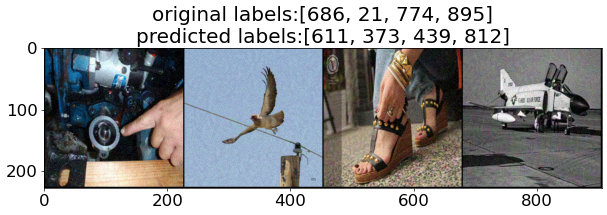

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: oil filter (686)
Image #2: kite (21)
Image #3: sandal (774)
Image #4: warplane, military plane (895)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: jigsaw puzzle (611)
Image #2: macaque (373)
Image #3: bearskin, busby, shako (439)
Image #4: space shuttle (812)


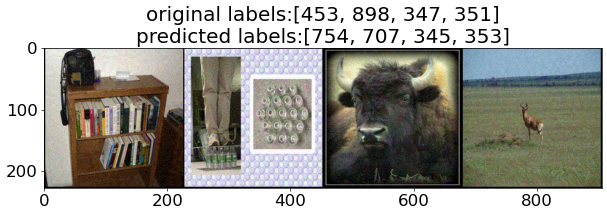

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: bookcase (453)
Image #6: water bottle (898)
Image #7: bison (347)
Image #8: hartebeest (351)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: radio, wireless (754)
Image #6: pay-phone, pay-station (707)
Image #7: ox (345)
Image #8: gazelle (353)
[Step #0] Loss: 0.5167 Accuracy: 0.0000% Time elapsed: 1.5626s (total 16 images)
[Step #10] Loss: 0.4590 Accuracy: 3.4091% Time elapsed: 2.2233s (total 176 images)
[Step #20] Loss: 0.4579 Accuracy: 4.7619% Time elapsed: 2.8776s (total 336 images)
[Step #30] Loss: 0.4531 Accuracy: 5.6452% Time elapsed: 3.5366s (total 496 images)
[Step #40] Loss: 0.4505 Accuracy: 5.3354% Time elapsed: 4.2007s (total 656 images)
[Step #50] Loss: 0.4507 Accuracy: 5.5147% Time elapsed: 4.8569s (total 816 images)
[Step #60] Loss: 0.4429 Accuracy: 5.7377% Time elapsed: 5.5165s (total 976 images)
[Step #70] Loss: 0.4397 Accuracy: 6.2500% Time elapsed: 6.1763s (total 1136 images)
[Step #80] Loss: 0.4425 Accuracy: 6

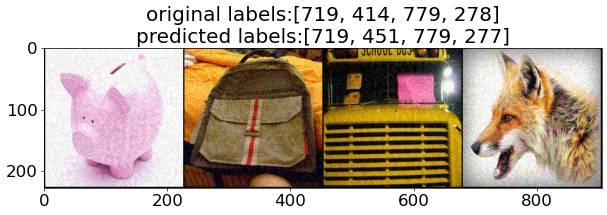

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: piggy bank, penny bank (719)
Image #2: backpack, back pack, knapsack, packsack, rucksack, haversack (414)
Image #3: school bus (779)
Image #4: kit fox, Vulpes macrotis (278)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: piggy bank, penny bank (719)
Image #2: bolo tie, bolo, bola tie, bola (451)
Image #3: school bus (779)
Image #4: red fox, Vulpes vulpes (277)


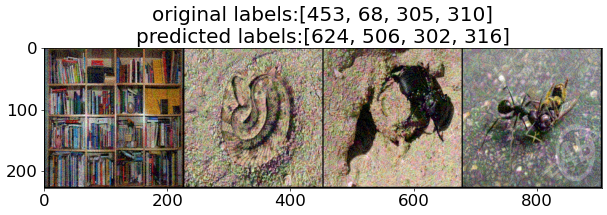

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: bookcase (453)
Image #6: sidewinder, horned rattlesnake, Crotalus cerastes (68)
Image #7: dung beetle (305)
Image #8: ant, emmet, pismire (310)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: library (624)
Image #6: coil, spiral, volute, whorl, helix (506)
Image #7: ground beetle, carabid beetle (302)
Image #8: cicada, cicala (316)
[Step #0] Loss: 0.3804 Accuracy: 12.5000% Time elapsed: 1.6235s (total 16 images)
[Step #10] Loss: 0.3958 Accuracy: 11.3636% Time elapsed: 2.2776s (total 176 images)
[Step #20] Loss: 0.4042 Accuracy: 10.7143% Time elapsed: 2.9341s (total 336 images)
[Step #30] Loss: 0.3972 Accuracy: 10.8871% Time elapsed: 3.5959s (total 496 images)
[Step #40] Loss: 0.4004 Accuracy: 10.5183% Time elapsed: 4.2510s (total 656 images)
[Step #50] Loss: 0.3958 Accuracy: 10.2941% Time elapsed: 4.9042s (total 816 images)
[Step #60] Loss: 0.3959 Accuracy: 10.1434% Time elapsed: 5.5620s (total 976 images)
[Step #70] Loss: 0.3970

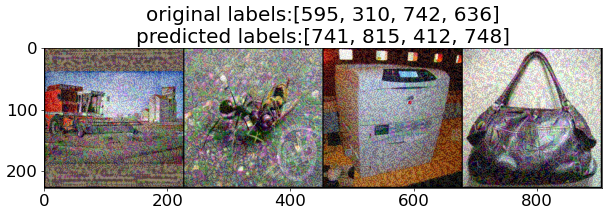

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: harvester, reaper (595)
Image #2: ant, emmet, pismire (310)
Image #3: printer (742)
Image #4: mailbag, postbag (636)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: prayer rug, prayer mat (741)
Image #2: spider web, spider's web (815)
Image #3: ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin (412)
Image #4: purse (748)


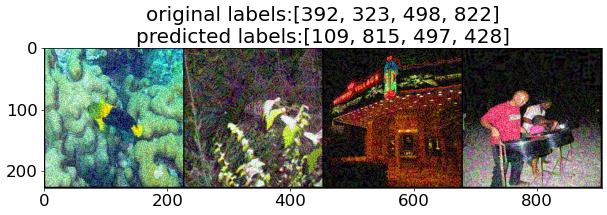

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: rock beauty, Holocanthus tricolor (392)
Image #6: monarch, monarch butterfly, milkweed butterfly, Danaus plexippus (323)
Image #7: cinema, movie theater, movie theatre, movie house, picture palace (498)
Image #8: steel drum (822)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: brain coral (109)
Image #6: spider web, spider's web (815)
Image #7: church, church building (497)
Image #8: barrow, garden cart, lawn cart, wheelbarrow (428)
[Step #0] Loss: 0.4033 Accuracy: 6.2500% Time elapsed: 1.5145s (total 16 images)
[Step #10] Loss: 0.3667 Accuracy: 8.5227% Time elapsed: 2.1806s (total 176 images)
[Step #20] Loss: 0.3870 Accuracy: 8.3333% Time elapsed: 2.8406s (total 336 images)
[Step #30] Loss: 0.3970 Accuracy: 8.4677% Time elapsed: 3.4972s (total 496 images)
[Step #40] Loss: 0.3955 Accuracy: 7.7744% Time elapsed: 4.1567s (total 656 images)
[Step #50] Loss: 0.3979 Accuracy: 7.5980% Time elapsed: 4.8188s (total 816 images)
[Step #60]

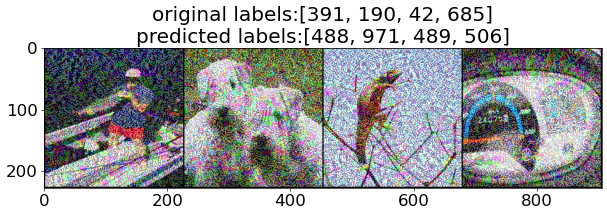

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: coho, cohoe, coho salmon, blue jack, silver salmon, Oncorhynchus kisutch (391)
Image #2: Sealyham terrier, Sealyham (190)
Image #3: agama (42)
Image #4: odometer, hodometer, mileometer, milometer (685)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: chain (488)
Image #2: bubble (971)
Image #3: chainlink fence (489)
Image #4: coil, spiral, volute, whorl, helix (506)


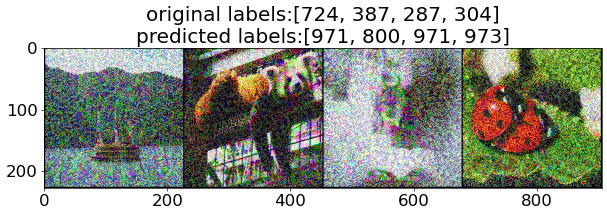

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: pirate, pirate ship (724)
Image #6: lesser panda, red panda, panda, bear cat, cat bear, Ailurus fulgens (387)
Image #7: lynx, catamount (287)
Image #8: leaf beetle, chrysomelid (304)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: bubble (971)
Image #6: slot, one-armed bandit (800)
Image #7: bubble (971)
Image #8: coral reef (973)
[Step #0] Loss: 0.6467 Accuracy: 0.0000% Time elapsed: 1.5673s (total 16 images)
[Step #10] Loss: 0.5910 Accuracy: 1.1364% Time elapsed: 2.2276s (total 176 images)
[Step #20] Loss: 0.5948 Accuracy: 1.1905% Time elapsed: 2.8878s (total 336 images)
[Step #30] Loss: 0.5958 Accuracy: 1.0081% Time elapsed: 3.5474s (total 496 images)
[Step #40] Loss: 0.5922 Accuracy: 0.9146% Time elapsed: 4.2049s (total 656 images)
[Step #50] Loss: 0.5885 Accuracy: 0.9804% Time elapsed: 4.8620s (total 816 images)
[Step #60] Loss: 0.5868 Accuracy: 1.0246% Time elapsed: 5.5175s (total 976 images)
[Step #70] Loss: 0.5877 Accurac

In [54]:
# 여기에 코드를 작성하세요.
torch.cuda.manual_seed(1218)
eps_value = [1/255, 2/255, 4/255, 8/255, 16/255, 32/255, 64/255]
for eps in eps_value:
    attack = FGSM(eps=eps) # 공격용 파라미터 설정
    attack_validate(resnet50, attack)

#### <b>(알아보기) PGD 공격 클래스 정의하기</b>

* PGD (Fast Gradient Sign Method) 공격(Linf)은 FGSM을 반복적으로 수행하는 것과 유사합니다.
    * 한꺼번에 각 픽셀을 eps만큼 바꾸지 않습니다.
    * <b>여러 번의 스텝(step)</b>으로 나누어 각 픽셀을 alpha만큼 조금씩 바꿉니다.
* PGD 공격은 적은 스텝(step = iters)만으로도 충분히 강력한 perturbation을 만들 수 있다는 장점이 있습니다.
    * 필요시 원본 논문([ICLR 2018](https://arxiv.org/abs/1706.06083))을 참고합니다.

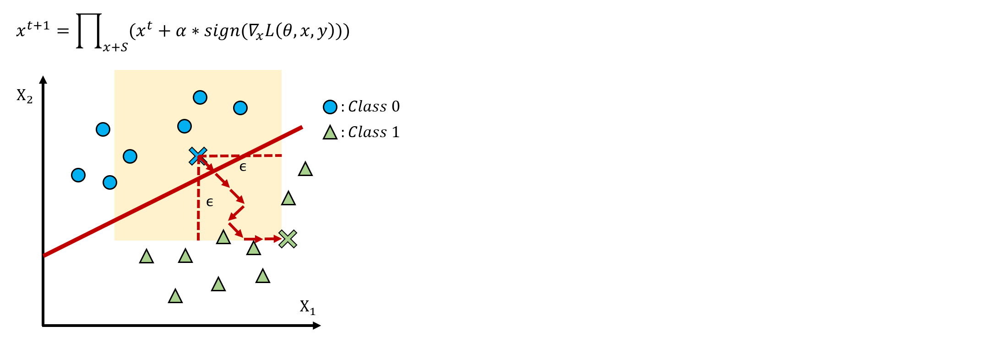

In [11]:
# PGD 공격 클래스
class PGD:
    def __init__(self, eps, alpha, iters):
        self.eps = eps
        self.alpha = alpha
        self.iters = iters # 반복 횟수(step size)
    
    def perturb(self, model, images, labels):
        # 이미지와 레이블 데이터를 GPU로 옮기기
        images = images.to(device)
        labels = labels.to(device)

        # 입력 이미지와 동일한 크기를 갖는 노이즈(perturbation) 생성
        # 노이즈 값은 음수가 될 수 있으므로, 평균이 0인 균등한(uniform) 랜덤 값으로 설정
        perturbation = torch.empty_like(images).uniform_(-self.eps, self.eps)
        perturbation.to(device)
        # 손실(loss) 함수 설정
        attack_loss = nn.CrossEntropyLoss()

        for i in range(self.iters):
            # required_grad 속성의 값을 True로 설정하여 해당 torch.Tensor의 연산을 추적
            perturbation.requires_grad = True

            # 현재 공격 이미지(원래 이미지에 노이즈를 섞고, 그 결과가 [0, 1] 범위에 속하도록 자르기)
            current = torch.clamp(images + perturbation, min=0, max=1)
            outputs = model(current) # 모델의 판단 결과 확인

            # 손실 함수에 대하여 미분하여 기울기(gradient) 계산
            model.zero_grad()
            cost = attack_loss(outputs, labels).to(device)
            cost.backward()

            # 계산된 기울기(gradient)를 이용하여 손실 함수가 증가하는 방향으로 업데이트
            diff = self.alpha * perturbation.grad.sign()
            # 결과적으로 노이즈(perturbation)의 각 픽셀의 값이 [-eps, eps] 사이의 값이 되도록 자르기
            perturbation = torch.clamp(perturbation + diff, min=-self.eps, max=self.eps).detach_() # 연산을 추적하는 것을 중단하기 위해 detach() 호출

        # (최종적으로 만들어진 공격 이미지, 노이즈) 반환
        current = torch.clamp(images + perturbation, min=0, max=1)
        return current, perturbation

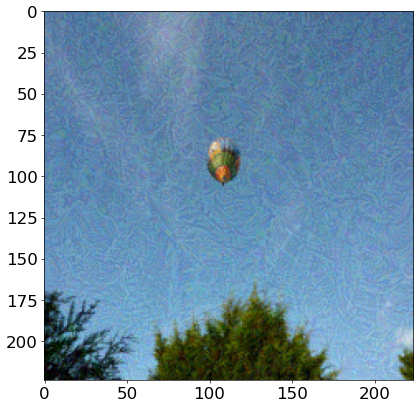

In [56]:
# 풍선(balloon)이 아닌 클래스로 분류되도록 공격 수행
label = [417]
label = torch.Tensor(label)
label = label.type(torch.long)

# 공격 결과 반환
attack = PGD(eps=16/255, alpha=4/255, iters=7) # 공격용 파라미터 설정
adv_image, perturbation = attack.perturb(resnet50, image, label)

# 최종적으로 만들어진 공격 이미지 출력
plt.figure()
imshow(adv_image)

In [57]:
# 완성된 공격 이미지를 실제 모델에 넣어 결과 확인
outputs = resnet50(adv_image)
# 확률을 계산하기 위해 소프트맥스(softmax) 함수 취하기
percentages = torch.nn.functional.softmax(outputs, dim=1)[0] * 100
# 가장 높은 값을 가지는 5개의 인덱스를 하나씩 확인하며
print("< 가장 높은 확률을 가지는 클래스들 >")
for i in outputs[0].topk(5)[1]:
    # 높은 값을 가지는 순서대로 인덱스에 해당하는 클래스 이름과, 그 확률 값 출력하기
    print(f"인덱스: {i.item()} / 클래스명: {imagenet_labels[i]} / 확률: {round(percentages[i].item(), 4)}%")

< 가장 높은 확률을 가지는 클래스들 >
인덱스: 815 / 클래스명: spider web, spider's web / 확률: 99.9976%
인덱스: 73 / 클래스명: barn spider, Araneus cavaticus / 확률: 0.002%
인덱스: 74 / 클래스명: garden spider, Aranea diademata / 확률: 0.0004%
인덱스: 72 / 클래스명: black and gold garden spider, Argiope aurantia / 확률: 0.0%
인덱스: 75 / 클래스명: black widow, Latrodectus mactans / 확률: 0.0%


The dimension of an image tensor: torch.Size([3, 224, 224])
[Prediction Result Examples]


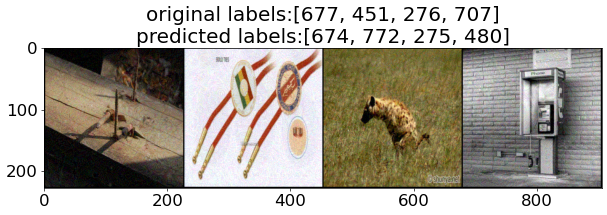

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: nail (677)
Image #2: bolo tie, bolo, bola tie, bola (451)
Image #3: hyena, hyaena (276)
Image #4: pay-phone, pay-station (707)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: mousetrap (674)
Image #2: safety pin (772)
Image #3: African hunting dog, hyena dog, Cape hunting dog, Lycaon pictus (275)
Image #4: cash machine, cash dispenser, automated teller machine, automatic teller machine, automated teller, automatic teller, ATM (480)


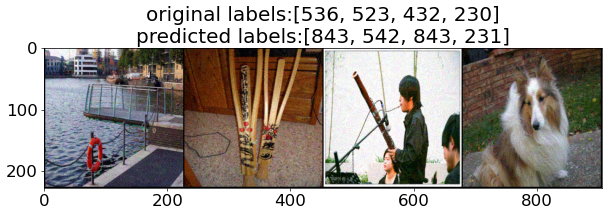

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: dock, dockage, docking facility (536)
Image #6: crutch (523)
Image #7: bassoon (432)
Image #8: Shetland sheepdog, Shetland sheep dog, Shetland (230)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: swing (843)
Image #6: drumstick (542)
Image #7: swing (843)
Image #8: collie (231)
[Step #0] Loss: 2.8660 Accuracy: 0.0000% Time elapsed: 2.0381s (total 16 images)
[Step #10] Loss: 2.8116 Accuracy: 0.0000% Time elapsed: 5.4857s (total 176 images)
[Step #20] Loss: 2.8270 Accuracy: 0.0000% Time elapsed: 8.9488s (total 336 images)
[Step #30] Loss: 2.8394 Accuracy: 0.0000% Time elapsed: 12.4216s (total 496 images)
[Step #40] Loss: 2.8631 Accuracy: 0.0000% Time elapsed: 15.8643s (total 656 images)
[Step #50] Loss: 2.8350 Accuracy: 0.0000% Time elapsed: 19.3174s (total 816 images)
[Step #60] Loss: 2.8537 Accuracy: 0.0000% Time elapsed: 22.7617s (total 976 images)
[Step #70] Loss: 2.8385 Accuracy: 0.0000% Time elapsed: 26.2109s (total 1136 ima

In [58]:
attack = PGD(eps=16/255, alpha=4/255, iters=7) # 공격용 파라미터 설정
attack_validate(resnet50, attack)

#### <b>Problem 4. PGD 공격 성능 분석하기</b>

* <b>적대적 노이즈(adversarial noise)</b>의 크기를 조절하며 PGD 공격 결과를 분석합니다.
    * 일반적으로 alpha 값은 eps / 4, step size는 7을 이용합니다. (기본 설정)
* 다음의 <b>eps 값을 바꾸어 가며</b> ResNet50 모델을 공격한 뒤에 모델의 정확도를 확인하세요.
    * 본 코드에서는 alpha와 step 파라미터는 기본 설정을 유지합니다.
    * PGD 공격 (eps=1/255): {4.80%}
    * PGD 공격 (eps=2/255): {1.22%}
    * PGD 공격 (eps=4/255): {0.00%}
    * PGD 공격 (eps=8/255): {0.00%}
    * PGD 공격 (eps=16/255): {0.00%}
    * PGD 공격 (eps=32/255): {0.00%}
    * PGD 공격 (eps=64/255): {0.00%}
* 본 실습에서는 모델의 정확도가 낮을수록, 공격력이 높은 것입니다.

The dimension of an image tensor: torch.Size([3, 224, 224])
[Prediction Result Examples]


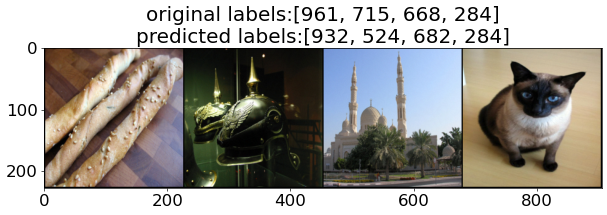

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: dough (961)
Image #2: pickelhaube (715)
Image #3: mosque (668)
Image #4: Siamese cat, Siamese (284)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: pretzel (932)
Image #2: cuirass (524)
Image #3: obelisk (682)
Image #4: Siamese cat, Siamese (284)


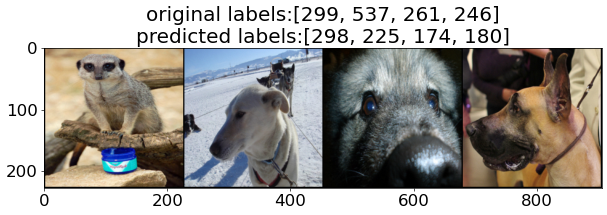

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: meerkat, mierkat (299)
Image #6: dogsled, dog sled, dog sleigh (537)
Image #7: keeshond (261)
Image #8: Great Dane (246)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: mongoose (298)
Image #6: malinois (225)
Image #7: Norwegian elkhound, elkhound (174)
Image #8: American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier (180)
[Step #0] Loss: 0.4854 Accuracy: 6.2500% Time elapsed: 2.2231s (total 16 images)
[Step #10] Loss: 0.4914 Accuracy: 4.5455% Time elapsed: 5.6780s (total 176 images)
[Step #20] Loss: 0.5091 Accuracy: 3.8690% Time elapsed: 9.1374s (total 336 images)
[Step #30] Loss: 0.5107 Accuracy: 4.6371% Time elapsed: 12.5896s (total 496 images)
[Step #40] Loss: 0.5202 Accuracy: 3.9634% Time elapsed: 16.0420s (total 656 images)
[Step #50] Loss: 0.5192 Accuracy: 4.0441% Time elapsed: 19.4969s (total 816 images)
[Step #60] Loss: 0.5135 Accuracy: 4.0984% Time elapsed: 22.9491s (total 976

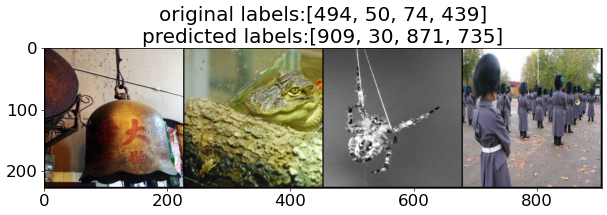

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: chime, bell, gong (494)
Image #2: American alligator, Alligator mississipiensis (50)
Image #3: garden spider, Aranea diademata (74)
Image #4: bearskin, busby, shako (439)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: wok (909)
Image #2: bullfrog, Rana catesbeiana (30)
Image #3: trimaran (871)
Image #4: poncho (735)


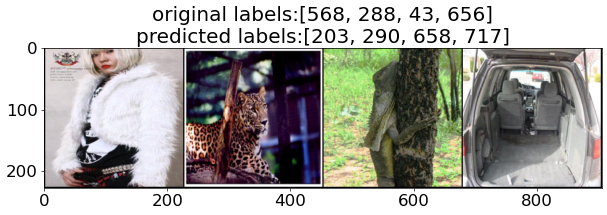

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: fur coat (568)
Image #6: leopard, Panthera pardus (288)
Image #7: frilled lizard, Chlamydosaurus kingi (43)
Image #8: minivan (656)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: West Highland white terrier (203)
Image #6: jaguar, panther, Panthera onca, Felis onca (290)
Image #7: mitten (658)
Image #8: pickup, pickup truck (717)
[Step #0] Loss: 0.6815 Accuracy: 0.0000% Time elapsed: 1.8257s (total 16 images)
[Step #10] Loss: 0.6722 Accuracy: 0.0000% Time elapsed: 5.2929s (total 176 images)
[Step #20] Loss: 0.6355 Accuracy: 0.0000% Time elapsed: 8.7581s (total 336 images)
[Step #30] Loss: 0.6274 Accuracy: 0.2016% Time elapsed: 12.2113s (total 496 images)
[Step #40] Loss: 0.6307 Accuracy: 0.6098% Time elapsed: 15.6633s (total 656 images)
[Step #50] Loss: 0.6307 Accuracy: 0.7353% Time elapsed: 19.1153s (total 816 images)
[Step #60] Loss: 0.6318 Accuracy: 0.8197% Time elapsed: 22.5691s (total 976 images)
[Step #70] Loss: 0.6344 Acc

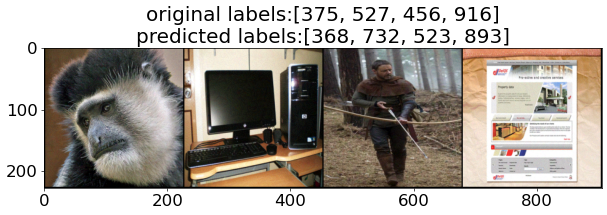

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: colobus, colobus monkey (375)
Image #2: desktop computer (527)
Image #3: bow (456)
Image #4: web site, website, internet site, site (916)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: gibbon, Hylobates lar (368)
Image #2: Polaroid camera, Polaroid Land camera (732)
Image #3: crutch (523)
Image #4: wallet, billfold, notecase, pocketbook (893)


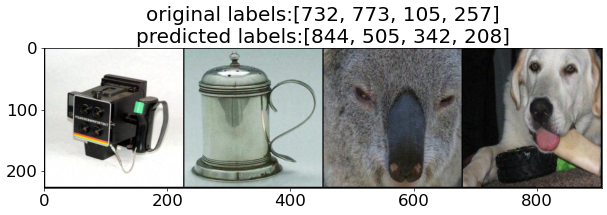

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Polaroid camera, Polaroid Land camera (732)
Image #6: saltshaker, salt shaker (773)
Image #7: koala, koala bear, kangaroo bear, native bear, Phascolarctos cinereus (105)
Image #8: Great Pyrenees (257)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: switch, electric switch, electrical switch (844)
Image #6: coffeepot (505)
Image #7: wild boar, boar, Sus scrofa (342)
Image #8: Labrador retriever (208)
[Step #0] Loss: 1.5510 Accuracy: 0.0000% Time elapsed: 1.9012s (total 16 images)
[Step #10] Loss: 1.3911 Accuracy: 0.0000% Time elapsed: 5.3960s (total 176 images)
[Step #20] Loss: 1.4193 Accuracy: 0.0000% Time elapsed: 8.8645s (total 336 images)
[Step #30] Loss: 1.4125 Accuracy: 0.0000% Time elapsed: 12.3255s (total 496 images)
[Step #40] Loss: 1.3885 Accuracy: 0.0000% Time elapsed: 15.8220s (total 656 images)
[Step #50] Loss: 1.3869 Accuracy: 0.0000% Time elapsed: 19.3059s (total 816 images)
[Step #60] Loss: 1.3853 Accuracy: 0.0000%

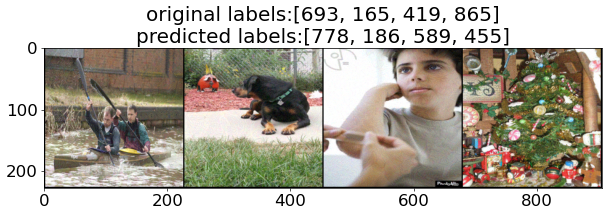

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: paddle, boat paddle (693)
Image #2: black-and-tan coonhound (165)
Image #3: Band Aid (419)
Image #4: toyshop (865)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: scale, weighing machine (778)
Image #2: Norwich terrier (186)
Image #3: hand blower, blow dryer, blow drier, hair dryer, hair drier (589)
Image #4: bottlecap (455)


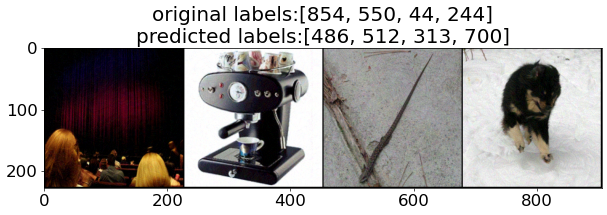

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: theater curtain, theatre curtain (854)
Image #6: espresso maker (550)
Image #7: alligator lizard (44)
Image #8: Tibetan mastiff (244)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: cello, violoncello (486)
Image #6: corkscrew, bottle screw (512)
Image #7: walking stick, walkingstick, stick insect (313)
Image #8: paper towel (700)
[Step #0] Loss: 2.8255 Accuracy: 0.0000% Time elapsed: 1.8733s (total 16 images)
[Step #10] Loss: 2.2076 Accuracy: 0.0000% Time elapsed: 5.3571s (total 176 images)
[Step #20] Loss: 2.2284 Accuracy: 0.0000% Time elapsed: 8.8364s (total 336 images)
[Step #30] Loss: 2.2445 Accuracy: 0.0000% Time elapsed: 12.3062s (total 496 images)
[Step #40] Loss: 2.2271 Accuracy: 0.0000% Time elapsed: 15.7785s (total 656 images)
[Step #50] Loss: 2.2184 Accuracy: 0.0000% Time elapsed: 19.2522s (total 816 images)
[Step #60] Loss: 2.2210 Accuracy: 0.0000% Time elapsed: 22.7193s (total 976 images)
[Step #70] Loss: 2.2286 Acc

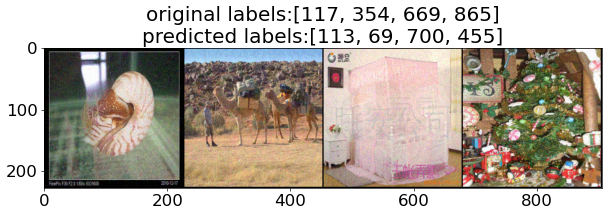

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: chambered nautilus, pearly nautilus, nautilus (117)
Image #2: Arabian camel, dromedary, Camelus dromedarius (354)
Image #3: mosquito net (669)
Image #4: toyshop (865)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: snail (113)
Image #2: trilobite (69)
Image #3: paper towel (700)
Image #4: bottlecap (455)


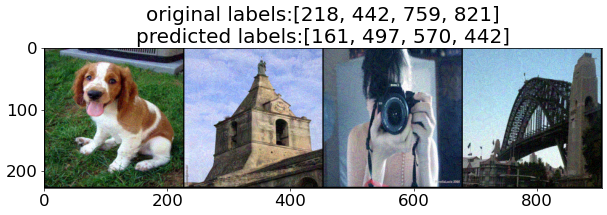

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Welsh springer spaniel (218)
Image #6: bell cote, bell cot (442)
Image #7: reflex camera (759)
Image #8: steel arch bridge (821)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: basset, basset hound (161)
Image #6: church, church building (497)
Image #7: gasmask, respirator, gas helmet (570)
Image #8: bell cote, bell cot (442)
[Step #0] Loss: 2.9225 Accuracy: 0.0000% Time elapsed: 1.8153s (total 16 images)
[Step #10] Loss: 2.7448 Accuracy: 0.0000% Time elapsed: 5.2984s (total 176 images)
[Step #20] Loss: 2.7299 Accuracy: 0.0000% Time elapsed: 8.7859s (total 336 images)
[Step #30] Loss: 2.7966 Accuracy: 0.0000% Time elapsed: 12.2850s (total 496 images)
[Step #40] Loss: 2.8072 Accuracy: 0.0000% Time elapsed: 15.7660s (total 656 images)
[Step #50] Loss: 2.8166 Accuracy: 0.0000% Time elapsed: 19.2341s (total 816 images)
[Step #60] Loss: 2.8177 Accuracy: 0.0000% Time elapsed: 22.7168s (total 976 images)
[Step #70] Loss: 2.8009 Accuracy

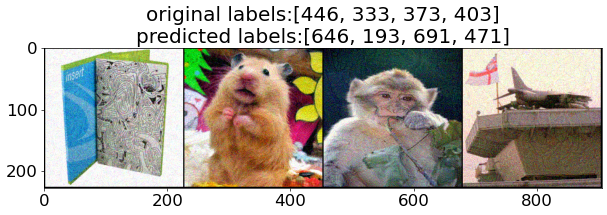

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: binder, ring-binder (446)
Image #2: hamster (333)
Image #3: macaque (373)
Image #4: aircraft carrier, carrier, flattop, attack aircraft carrier (403)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: maze, labyrinth (646)
Image #2: Australian terrier (193)
Image #3: oxygen mask (691)
Image #4: cannon (471)


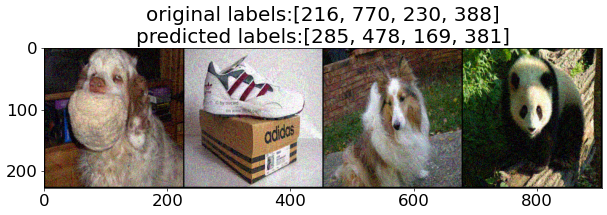

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: clumber, clumber spaniel (216)
Image #6: running shoe (770)
Image #7: Shetland sheepdog, Shetland sheep dog, Shetland (230)
Image #8: giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca (388)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: Egyptian cat (285)
Image #6: carton (478)
Image #7: borzoi, Russian wolfhound (169)
Image #8: spider monkey, Ateles geoffroyi (381)
[Step #0] Loss: 2.9108 Accuracy: 0.0000% Time elapsed: 1.8845s (total 16 images)
[Step #10] Loss: 3.1615 Accuracy: 0.0000% Time elapsed: 5.3758s (total 176 images)
[Step #20] Loss: 3.2073 Accuracy: 0.0000% Time elapsed: 8.8653s (total 336 images)
[Step #30] Loss: 3.1978 Accuracy: 0.0000% Time elapsed: 12.3306s (total 496 images)
[Step #40] Loss: 3.2306 Accuracy: 0.0000% Time elapsed: 15.8087s (total 656 images)
[Step #50] Loss: 3.2384 Accuracy: 0.0000% Time elapsed: 19.2779s (total 816 images)
[Step #60] Loss: 3.2362 Accuracy: 0.0000% Time elapsed: 22

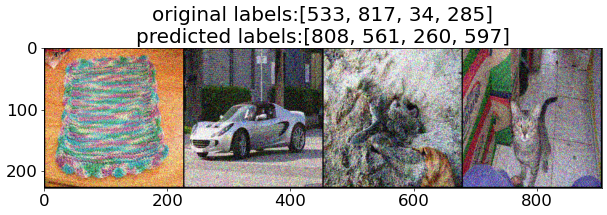

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: dishrag, dishcloth (533)
Image #2: sports car, sport car (817)
Image #3: leatherback turtle, leatherback, leathery turtle, Dermochelys coriacea (34)
Image #4: Egyptian cat (285)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: sombrero (808)
Image #2: forklift (561)
Image #3: chow, chow chow (260)
Image #4: holster (597)


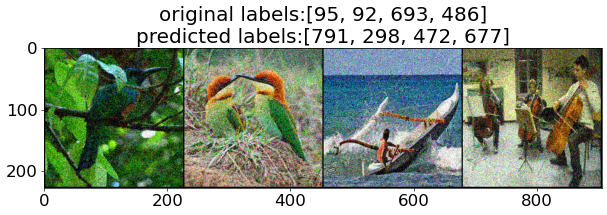

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: jacamar (95)
Image #6: bee eater (92)
Image #7: paddle, boat paddle (693)
Image #8: cello, violoncello (486)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: shopping cart (791)
Image #6: mongoose (298)
Image #7: canoe (472)
Image #8: nail (677)
[Step #0] Loss: 3.6588 Accuracy: 0.0000% Time elapsed: 1.8954s (total 16 images)
[Step #10] Loss: 3.4697 Accuracy: 0.0000% Time elapsed: 5.4584s (total 176 images)
[Step #20] Loss: 3.4822 Accuracy: 0.0000% Time elapsed: 8.9764s (total 336 images)
[Step #30] Loss: 3.4871 Accuracy: 0.0000% Time elapsed: 12.4667s (total 496 images)
[Step #40] Loss: 3.4799 Accuracy: 0.0000% Time elapsed: 15.9570s (total 656 images)
[Step #50] Loss: 3.4731 Accuracy: 0.0000% Time elapsed: 19.4462s (total 816 images)
[Step #60] Loss: 3.4758 Accuracy: 0.0000% Time elapsed: 22.9288s (total 976 images)
[Step #70] Loss: 3.4665 Accuracy: 0.0000% Time elapsed: 26.4113s (total 1136 images)
[Step #80] Loss: 3.4725 Accura

In [59]:
# 여기에 코드를 작성하세요.
torch.cuda.manual_seed(1218)
eps_value = [1/255, 2/255, 4/255, 8/255, 16/255, 32/255, 64/255]
for eps in eps_value:
    attack = PGD(eps=eps, alpha=4/255, iters=7) # 공격용 파라미터 설정
    attack_validate(resnet50, attack)

#### <b>(알아보기) Black-box 공격 개요</b>

* 지금까지의 실습에서는 공격자가 사전 학습된 공격 대상 모델의 모든 정보를 알고 있었습니다.
    * 학습된 가중치(weight)를 알고 있을 때는 역전파(backpropagation)가 가능합니다.
    * 하지만 <b>공격 대상 모델의 가중치를 모를 때</b>는 어떻게 공격할 수 있을까요?
* 적대적 예제(adversarial example)은 모델 사이에서 전송 가능한(transferable) 특징이 있습니다.
* 이러한 <b>transferability를 이용한 공격 방법</b>은 다음과 같습니다.
    1. 공격자가 개인적으로 공격 대상 모델(black-box)과 유사한 대체 모델(substitute model)을 학습합니다.
    2. 자신의 대체 모델에 대하여 white-box 공격을 수행해 adversarial example을 생성합니다.
    3. 해당 adversarial example을 공격 대상인 black-box 모델에 넣어 최종적으로 공격을 수행합니다.

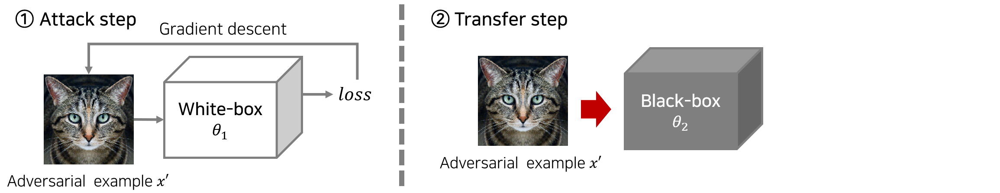

#### <b>Problem 5. 강력한 Black-box 공격 기법 설계하기</b>

* 나만의 공격 알고리즘을 이용하여 black-box 상황에서 Inception v3 모델을 공격해 보세요.
* (Hint) MI-FGSM ([CVPR 2018](https://arxiv.org/abs/1710.06081))을 사용해 보세요.
    * [YouTube 설명 링크](https://www.youtube.com/watch?v=QCgujoTPbmU)
* (Hint) 내가 갖고 있는 모델의 앙상블에 대하여 생성한 perturbation을 활용할 수 있습니다.
* (중요) 공격 대상이 되는 <b>Inception v3에 대해서는 forward()만 가능</b>하다고 가정합니다.
    * Inception v3 모델을 대상으로 역전파(backpropagation)를 수행하면 안 됩니다.
    * Inception v3를 제외한 다른 모델은 몇 개라도 사용해도 괜찮지만, <b>Inception 계열의 모델은 사용할 수 없습니다.</b>
    * Inception 계열의 모델: Inception v3, Inception v4, Inception-ResNet-V2 등 이름에 <b>Inception</b>이 들어간 모델
* (중요) 모든 이미지에 대하여 각 픽셀을 최대 16/255만큼 바꿀 수 있습니다.
    * 다시 말해 모든 이미지에 대하여 Linf 거리가 0.062745 (16/255)이하여야 합니다.
    * eps은 16/255으로 고정하되, alpha나 step을 자유롭게 바꾸어 보는 방법을 추천합니다.
* 아래 코드에서 black_box_attack_validate() 함수와, CustomAttack 클래스는 변경이 가능합니다.
    * 하지만 black_box_model에 대하여 forward()만 수행해야 한다는 점에 꼭 유의하세요. (역전파 불가)
* 점수 판정 기준
    * <b>black-box 모델의 정확도(accuracy)가 가장 낮게 나오는 팀</b>이 1등입니다.
* 최종적으로 <b>팀 단위로 제출할 파일</b>은 다음과 같습니다.
    1. Colab Notebook 파일: <b>[파일]</b> - <b>[다운로드]</b> - <b>[.ipynb 다운로드]</b>

In [12]:
# 이 코드는 바꾸실 수 없습니다.
black_box_model = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.inception_v3(pretrained=True)
).to(device).eval()

C:\Users\USER\anaconda3\envs\preparation\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [13]:
def black_box_attack_validate(model, black_box_model, attack):
    criterion = nn.CrossEntropyLoss()
    start_time = time.time()

    running_loss = 0.
    running_corrects = 0
    running_length = 0

    running_l0 = 0
    running_l2 = 0
    running_mse = 0
    running_linf = 0

    for i, (inputs, basic_labels) in enumerate(val_dataloader):
        inputs = inputs.to(device)
        labels = torch.zeros_like(basic_labels).long().to(device)
        for j in range(labels.shape[0]):
            labels[j] = int(class_names[basic_labels[j]])
        labels = labels.to(device)

        adv_image, perturbation = attack.perturb(model, inputs, labels) # adversarial attack

        outputs = black_box_model(adv_image)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)
        running_length += labels.shape[0]

        l0, l2, mse, linf = get_distance(adv_image, inputs)
        running_l0 += l0.sum().item()
        running_l2 += l2.sum().item()
        running_mse += mse.sum().item()
        running_linf += linf.sum().item()

        if i == 0:
            print('The dimension of an image tensor:', inputs.shape[1:])
            print('[Prediction Result Examples]')
            images = torchvision.utils.make_grid(adv_image[:4])
            imshow_batch(images.cpu(), title='original labels:' + str([int(x) for x in labels[:4]]) +
                          '\npredicted labels:' + str([int(x) for x in preds[:4]]))
            print('Original labels >>>>>>>>>>>>>>>>>>>>>>>>>')
            for j, imagenet_index in enumerate(labels[:4]):
                label = imagenet_labels[imagenet_index]
                print(f'Image #{j + 1}: {label} ({imagenet_index})')
            print('Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>')
            for j, imagenet_index in enumerate(preds[:4]):
                label = imagenet_labels[imagenet_index]
                print(f'Image #{j + 1}: {label} ({imagenet_index})')
            images = torchvision.utils.make_grid(adv_image[4:8])
            imshow_batch(images.cpu(), title='original labels:' + str([int(x) for x in labels[4:8]]) +
                          '\npredicted labels:' + str([int(x) for x in preds[4:8]]))
            print('Original labels >>>>>>>>>>>>>>>>>>>>>>>>>')
            for j, imagenet_index in enumerate(labels[4:8]):
                label = imagenet_labels[imagenet_index]
                print(f'Image #{j + 5}: {label} ({imagenet_index})')
            print('Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>')
            for j, imagenet_index in enumerate(preds[4:8]):
                label = imagenet_labels[imagenet_index]
                print(f'Image #{j + 5}: {label} ({imagenet_index})')

        if i % 10 == 0:
            cur_running_loss = running_loss / running_length
            running_acc = running_corrects / running_length * 100.
            print('[Step #{}] Loss: {:.4f} Accuracy: {:.4f}% Time elapsed: {:.4f}s (total {} images)'.format(i, cur_running_loss, running_acc, time.time() - start_time, running_length))

    epoch_loss = running_loss / len(val_dataset)
    epoch_acc = running_corrects / len(val_dataset) * 100.
    print('[Validation] Loss: {:.4f} Accuracy: {:.4f}% Time elapsed: {:.4f}s (total {} images)'.format(epoch_loss, epoch_acc, time.time() - start_time, len(val_dataset)))

    print('[Size of Perturbation]')
    print('Average L0 distance (the number of changed parameters):', running_l0 / len(val_dataset))
    print('Average L2 distance:', running_l2 / len(val_dataset))
    print('Average MSE:', running_mse / len(val_dataset))
    print('Average Linf distance (the maximum changed values):', running_linf / len(val_dataset))

In [14]:
# 커스텀 공격 클래스 예시
class CustomAttack:
    def __init__(self, eps, alpha, iters, beta):
        self.eps = eps
        self.alpha = alpha
        self.iters = iters
        self.beta = beta

    def perturb(self, models, images, labels):
        # 이미지와 레이블 데이터를 GPU로 옮기기
        images = images.to(device)
        labels = labels.to(device)

        # 입력 이미지와 동일한 크기를 갖는 노이즈(perturbation) 생성
        # 노이즈 값은 음수가 될 수 있으므로, 평균이 0인 균등한(uniform) 랜덤 값으로 설정
        perturbation = torch.empty_like(images).uniform_(-self.eps, self.eps)
        perturbation.to(device)
        # 손실(loss) 함수 설정
        attack_loss = nn.CrossEntropyLoss()
        momentum =torch.zeros_like(images).detach().to(device)

        for i in range(self.iters):
            # required_grad 속성의 값을 True로 설정하여 해당 torch.Tensor의 연산을 추적
            perturbation.requires_grad = True
            # 모두 같은 가중치로 모델의 합을 구한다.
            outputs = torch.zeros((16, 1000)).detach().to(device)
            for model in models:
            # 현재 공격 이미지(원래 이미지에 노이즈를 섞고, 그 결과가 [0, 1] 범위에 속하도록 자르기)
                perturbation.requires_grad = True
                current = torch.clamp(images + perturbation, min=0, max=1)
                outputs = model(current)# 모델의 판단 결과 확인
                # 손실 함수에 대하여 미분하여 기울기(gradient) 계산
                model.zero_grad()
                cost = attack_loss(outputs, labels).to(device)
                cost.backward()
    
                # 계산된 기울기(gradient)를 이용하여 손실 함수가 증가하는 방향으로 업데이트
                m_grad = self.beta * momentum + perturbation.grad/torch.sum(torch.abs(perturbation.grad))
                # 결과적으로 노이즈(perturbation)의 각 픽셀의 값이 [-eps, eps] 사이의 값이 되도록 자르기
                momentum += perturbation.grad
                perturbation = torch.clamp(perturbation + self.alpha * m_grad.sign(), min=-self.eps, max=self.eps).detach_() # 연산을 추적하는 것을 중단하기 위해 detach() 호출

        # (최종적으로 만들어진 공격 이미지, 노이즈) 반환
        current = torch.clamp(images + perturbation, min=0, max=1)
        return current, perturbation

* 아래 코드는 블랙박스 공격 예제 코드입니다.
    * 블랙박스 모델(Inception v3)에 대하여 정확도를 44.02%까지 떨어뜨렸습니다.
    * 여러분은 얼마나 더 떨어뜨릴 수 있으신가요?

In [23]:
# # 블랙박스 공격 예제 코드입니다.
# torch.cuda.manual_seed(1218)
# custom_attack = CustomAttack(eps=16/255, alpha=10/255, iters=4) # 공격용 파라미터 설정
# black_box_attack_validate(resnet50, black_box_model, custom_attack)

In [22]:
densenet121 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.densenet161(pretrained = True)
).to(device).eval()
densenet201 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.densenet201(pretrained = True)
).to(device).eval()
mobilenet_v2 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.mobilenet_v2(pretrained=True)
).to(device).eval()
vgg16 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.vgg16(pretrained=True)
).to(device).eval()
resnet50_2 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.wide_resnet50_2(pretrained=True)
).to(device).eval()
resnet50 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet50(pretrained=True)
).to(device).eval()
resnet101 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet101(pretrained=True)
).to(device).eval()
resnet152 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnet152(pretrained=True)
).to(device).eval()
resnet50_32x4d = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.resnext50_32x4d(pretrained=True)
).to(device).eval()
efficientnet_v2_s = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.efficientnet_v2_s(pretrained=True)
).to(device).eval()
efficientnet_v2_m = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.efficientnet_v2_m(pretrained=True)
).to(device).eval()
densenet169 = nn.Sequential(
    # 입력 정규화 레이어를 추가하기
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    torchvision.models.densenet169(pretrained=True)
).to(device).eval()

C:\Users\USER\anaconda3\envs\preparation\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=EfficientNet_V2_M_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_V2_M_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_v2_m-dc08266a.pth" to C:\Users\USER/.cache\torch\hub\checkpoints\efficientnet_v2_m-dc08266a.pth
100%|███████████████████████████████████████████████████████████████████████████████| 208M/208M [00:04<00:00, 50.5MB/s]


The dimension of an image tensor: torch.Size([3, 224, 224])
[Prediction Result Examples]


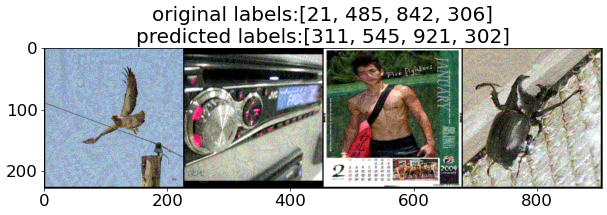

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: kite (21)
Image #2: CD player (485)
Image #3: swimming trunks, bathing trunks (842)
Image #4: rhinoceros beetle (306)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: grasshopper, hopper (311)
Image #2: electric fan, blower (545)
Image #3: book jacket, dust cover, dust jacket, dust wrapper (921)
Image #4: ground beetle, carabid beetle (302)


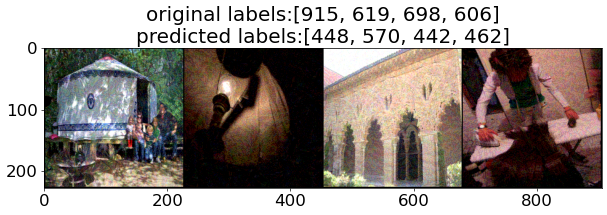

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: yurt (915)
Image #6: lampshade, lamp shade (619)
Image #7: palace (698)
Image #8: iron, smoothing iron (606)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: birdhouse (448)
Image #6: gasmask, respirator, gas helmet (570)
Image #7: bell cote, bell cot (442)
Image #8: broom (462)
[Step #0] Loss: 1.0574 Accuracy: 0.0000% Time elapsed: 7.1927s (total 16 images)
[Step #10] Loss: 0.8944 Accuracy: 5.1136% Time elapsed: 59.5135s (total 176 images)
[Step #20] Loss: 0.8726 Accuracy: 5.6548% Time elapsed: 111.5958s (total 336 images)
[Step #30] Loss: 0.8741 Accuracy: 5.2419% Time elapsed: 164.0955s (total 496 images)
[Step #40] Loss: 0.8872 Accuracy: 5.0305% Time elapsed: 216.4084s (total 656 images)
[Step #50] Loss: 0.8899 Accuracy: 5.1471% Time elapsed: 268.5435s (total 816 images)
[Step #60] Loss: 0.8827 Accuracy: 5.4303% Time elapsed: 320.5354s (total 976 images)
[Step #70] Loss: 0.8791 Accuracy: 5.6338% Time elapsed: 372.7357s (total 1

In [17]:
torch.cuda.manual_seed(1218)
# 블랙박스 공격 예제 코드입니다.
custom_attack = CustomAttack(eps=16/255, alpha=8/255, iters=10, beta=1.0) # 공격용 파라미터 설정
black_box_attack_validate([resnet50_32x4d, densenet121, densenet201, resnet50, resnet101, resnet152], black_box_model, custom_attack)

The dimension of an image tensor: torch.Size([3, 224, 224])
[Prediction Result Examples]


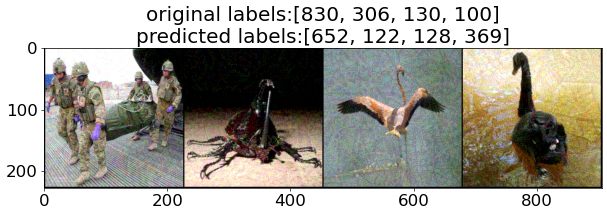

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: stretcher (830)
Image #2: rhinoceros beetle (306)
Image #3: flamingo (130)
Image #4: black swan, Cygnus atratus (100)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: military uniform (652)
Image #2: American lobster, Northern lobster, Maine lobster, Homarus americanus (122)
Image #3: black stork, Ciconia nigra (128)
Image #4: siamang, Hylobates syndactylus, Symphalangus syndactylus (369)


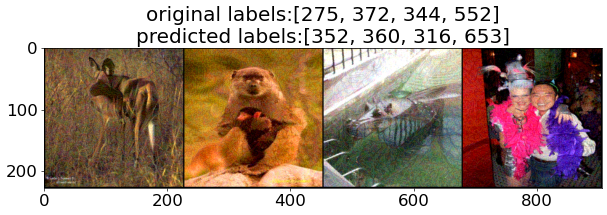

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: African hunting dog, hyena dog, Cape hunting dog, Lycaon pictus (275)
Image #6: baboon (372)
Image #7: hippopotamus, hippo, river horse, Hippopotamus amphibius (344)
Image #8: feather boa, boa (552)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: impala, Aepyceros melampus (352)
Image #6: otter (360)
Image #7: cicada, cicala (316)
Image #8: milk can (653)
[Step #0] Loss: 0.9152 Accuracy: 0.0000% Time elapsed: 5.4447s (total 16 images)
[Step #10] Loss: 0.9227 Accuracy: 3.9773% Time elapsed: 40.7077s (total 176 images)
[Step #20] Loss: 0.9261 Accuracy: 3.5714% Time elapsed: 76.0427s (total 336 images)
[Step #30] Loss: 0.9305 Accuracy: 4.4355% Time elapsed: 111.7858s (total 496 images)
[Step #40] Loss: 0.9399 Accuracy: 3.9634% Time elapsed: 147.8357s (total 656 images)
[Step #50] Loss: 0.9384 Accuracy: 4.0441% Time elapsed: 183.6396s (total 816 images)
[Step #60] Loss: 0.9461 Accuracy: 3.7910% Time elapsed: 219.0476s (total 976 imag

In [20]:
torch.cuda.manual_seed(1218)
# 블랙박스 공격 예제 코드입니다.
custom_attack = CustomAttack(eps=16/255, alpha=8/255, iters=5, beta=1.0) # 공격용 파라미터 설정
black_box_attack_validate([efficientnet_v2_s,resnet50_32x4d, densenet121, densenet169, densenet201, resnet50, resnet101, resnet152], black_box_model, custom_attack)

The dimension of an image tensor: torch.Size([3, 224, 224])
[Prediction Result Examples]


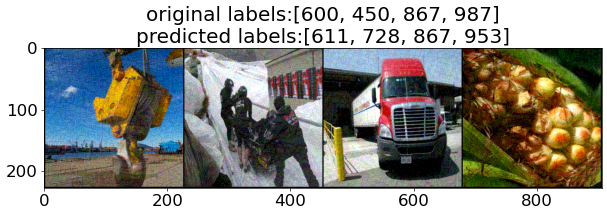

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: hook, claw (600)
Image #2: bobsled, bobsleigh, bob (450)
Image #3: trailer truck, tractor trailer, trucking rig, rig, articulated lorry, semi (867)
Image #4: corn (987)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #1: jigsaw puzzle (611)
Image #2: plastic bag (728)
Image #3: trailer truck, tractor trailer, trucking rig, rig, articulated lorry, semi (867)
Image #4: pineapple, ananas (953)


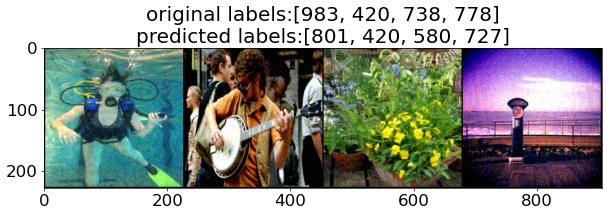

Original labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: scuba diver (983)
Image #6: banjo (420)
Image #7: pot, flowerpot (738)
Image #8: scale, weighing machine (778)
Predicted labels >>>>>>>>>>>>>>>>>>>>>>>>>
Image #5: snorkel (801)
Image #6: banjo (420)
Image #7: greenhouse, nursery, glasshouse (580)
Image #8: planetarium (727)
[Step #0] Loss: 0.7171 Accuracy: 12.5000% Time elapsed: 5.6438s (total 16 images)
[Step #10] Loss: 0.8895 Accuracy: 3.4091% Time elapsed: 43.2832s (total 176 images)
[Step #20] Loss: 0.8777 Accuracy: 5.0595% Time elapsed: 80.8495s (total 336 images)
[Step #30] Loss: 0.9066 Accuracy: 4.8387% Time elapsed: 118.9830s (total 496 images)
[Step #40] Loss: 0.9110 Accuracy: 5.0305% Time elapsed: 157.0767s (total 656 images)
[Step #50] Loss: 0.9134 Accuracy: 4.2892% Time elapsed: 194.8765s (total 816 images)
[Step #60] Loss: 0.9220 Accuracy: 4.4057% Time elapsed: 232.8304s (total 976 images)
[Step #70] Loss: 0.9215 Accuracy: 4.2254% Time elapsed: 270.5128s (total 1136 imag

In [23]:
torch.cuda.manual_seed(1218)
# 블랙박스 공격 예제 코드입니다.
custom_attack = CustomAttack(eps=16/255, alpha=8/255, iters=5, beta=1.0) # 공격용 파라미터 설정
black_box_attack_validate([efficientnet_v2_m,resnet50_32x4d, densenet121, densenet169, densenet201, resnet50, resnet101, resnet152], black_box_model, custom_attack)